# TarDis Training for Sciplex dataset

In [1]:
0

0

In [2]:
import sys

working_directory = "/home/icb/kemal.inecik/work/codes/sctram"
sys.path.append(working_directory)
sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")

In [3]:
import copy
import gc
import itertools
import os
import subprocess
import sys
import time
import warnings
from pathlib import Path

import anndata as ad
import networkx as nx
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.stats
import torch
from sklearn.neighbors import kneighbors_graph
import lightning.pytorch as pl
import torch
import anndata as ad

In [4]:
from helper.callbacks import EpochStepLogger, LatentOnIndexCallback
import tardis
from tardis._disentanglementmanager import DisentanglementManager as DM
from sctram.generate.real import sc_norman_sciplex_cpa


tardis.config = tardis.config_server

In [5]:
# Important to have consistent figures across platforms

%matplotlib inline
%config InlineBackend.figure_format='retina'

import matplotlib.pyplot as plt
import seaborn as sns
import pickle

_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)

plt.rcParams.update(_rcparams)

In [6]:
print(f"CUDA used: {torch.cuda.is_available()}")

dataset_dir = "/home/icb/kemal.inecik/lustre_workspace/temp_sctram_data"
helpers_directory = os.path.join(os.getcwd(), "helper")
logs_directory = os.path.join(os.getcwd(), "logs")

CUDA used: True


In [7]:
adata = sc_norman_sciplex_cpa(dataset_dir=dataset_dir)

adata.X = adata.layers["counts"].copy()
del adata.layers
adata.obs.loc[adata.obs["dose"] == "0.0", "dose_val"] = 0.0
d = {i: ind for ind, i in enumerate(sorted(adata.obs["dose"].astype(float).unique()))}
adata.obs["dose_training"] = [d[float(i)] for i in adata.obs["dose"]]
gc.collect()

# as it is modified
adata.write_h5ad(os.path.join(dataset_dir, f"tardis_cpa_sciplex_v2_encode_incremental_training_anndata.h5ad"))

adata

2025-05-09 12:22:47.032 | WARNING  | sctram.generate.real._download:download_dataset:105 - File PosixPath('/home/icb/kemal.inecik/lustre_workspace/temp_sctram_data/norman_sciplex_cpa.h5ad') already exists. Skipping download.


AnnData object with n_obs × n_vars = 14811 × 4999
    obs: 'sample', 'size_factor', 'n.umi', 'hash_umis', 'pval', 'qval', 'top_to_second_best_ratio', 'top_oligo', 'drug', 'dose', 'vehicle', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'product_dose', 'louvain', 'dose_val', 'cell_type', 'drug_dose_name', 'cov_drug_dose_name', 'condition', 'control', 'split', 'dose_training', '_scvi_batch', '_scvi_labels'
    var: 'id', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'dose_colors', 'drug_colors', 'log1p', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'product_dose_colors', 'rank_genes_groups_cov', 'vehicle_colors'
    obsm: 'X_pca', '_scvi_disentanglement_target', '_scvi_metrics_helper', 'scvi', 'tardis'
    varm: 'PCs'

In [8]:
step_per_epoch = 186  # gotten from the callback
print(step_per_epoch)

epochs = list(itertools.chain(range(0, 90, 1), range(90, 600, 40)))
epochs = list(np.arange(6, 90, 0.25)) + epochs
epochs = [round(i, 2) for i in epochs]
steps = sorted(set([int(i*step_per_epoch) for i in epochs]))

print(np.array(steps))
print(len(steps))

186
[     0    186    372    558    744    930   1116   1162   1209   1255
   1302   1348   1395   1441   1488   1534   1581   1627   1674   1720
   1767   1813   1860   1906   1953   1999   2046   2092   2139   2185
   2232   2278   2325   2371   2418   2464   2511   2557   2604   2650
   2697   2743   2790   2836   2883   2929   2976   3022   3069   3115
   3162   3208   3255   3301   3348   3394   3441   3487   3534   3580
   3627   3673   3720   3766   3813   3859   3906   3952   3999   4045
   4092   4138   4185   4231   4278   4324   4371   4417   4464   4510
   4557   4603   4650   4696   4743   4789   4836   4882   4929   4975
   5022   5068   5115   5161   5208   5254   5301   5347   5394   5440
   5487   5533   5580   5626   5673   5719   5766   5812   5859   5905
   5952   5998   6045   6091   6138   6184   6231   6277   6324   6370
   6417   6463   6510   6556   6603   6649   6696   6742   6789   6835
   6882   6928   6975   7021   7068   7114   7161   7207   7254   7300
  

In [9]:
cb_latent = LatentOnIndexCallback(
    indices=steps,
    capture_by="step",
    adata=adata,
    subset_idx=None,
    latent_dir=dataset_dir,
    latent_base_name="tardis_cpa_sciplex_v2_encode_incremental"
)
logger_cb = EpochStepLogger()

In [10]:
model_level_metrics = [
    dict(
        metric_identifier="metric_mi|dose_training",
        training_set=["train", "validation"],
        every_n_epoch=5,
        subsample=1.0,
        progress_bar=True,
        metric_kwargs=dict(variation="normalized", discretization_bins=256, latent_subset=None, reduce=np.mean),
    ),
    dict(
        metric_identifier="metric_mi|condition",
        training_set=["train", "validation"],
        every_n_epoch=5,
        subsample=1.0,
        progress_bar=True,
        metric_kwargs=dict(variation="normalized", discretization_bins=256, latent_subset=None, reduce=np.mean),
    ),
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method="categorical_random",
    method_kwargs=dict(
        within_labels=False,
        within_batch=False,
        within_categorical_covs=None,
        seed="forward",
    ),
)

disentenglement_targets_configurations = [
    dict(
        obs_key="dose_training",
        n_reserved_latent=8,
        counteractive_minibatch_settings=counteractive_minibatch_settings,
        auxillary_losses=[
            dict(
                apply=True,
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar=False,
                weight=dtc_w1,
                method="mse_z",
                latent_group="reserved",
                counteractive_example="negative",
                transformation="inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs={},
            ),
            dict(
                apply=True,
                target_type="categorical",
                progress_bar=False,
                weight=dtc_w2,
                method="mse_z",
                latent_group="reserved",
                counteractive_example="positive",
                transformation="none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs={},
            ),
            dict(
                apply=True,
                target_type="categorical",
                progress_bar=False,
                weight=dtc_w2 * 1,
                method="mse_z",
                latent_group="unreserved_complete",
                counteractive_example="negative",
                transformation="none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs={},
            ),
            dict(
                apply=True,
                target_type="categorical",
                progress_bar=False,
                weight=dtc_w1 * 1,
                method="mse_z",
                latent_group="unreserved_complete",
                counteractive_example="positive",
                transformation="inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs={},
            ),
        ],
    ),
    dict(
        obs_key="condition",
        n_reserved_latent=8,
        counteractive_minibatch_settings=counteractive_minibatch_settings,
        auxillary_losses=[
            dict(
                apply=True,
                target_type="categorical",
                progress_bar=False,
                weight=dtc_w1,
                method="mse_z",
                latent_group="reserved",
                counteractive_example="negative",
                transformation="inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs={},
            ),
            dict(
                apply=True,
                target_type="categorical",
                progress_bar=False,
                weight=dtc_w2,
                method="mse_z",
                latent_group="reserved",
                counteractive_example="positive",
                transformation="none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs={},
            ),
            dict(
                apply=True,
                target_type="categorical",
                progress_bar=False,
                weight=dtc_w2 * 1,
                method="mse_z",
                latent_group="unreserved_complete",
                counteractive_example="negative",
                transformation="none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs={},
            ),
            dict(
                apply=True,
                target_type="categorical",
                progress_bar=False,
                weight=dtc_w1 * 1,
                method="mse_z",
                latent_group="unreserved_complete",
                counteractive_example="positive",
                transformation="inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs={},
            ),
        ],
    ),
]

In [12]:
max_epochs = 600
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3,
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood="nb",
    use_batch_norm="none",
    use_layer_norm="both",
    dropout_rate=0.5,
    deeply_inject_disentengled_latents=True,
    include_auxillary_loss=True,
    beta_kl_weight=0.5,
    encode_covariates=False,
)

train_params = dict(
    max_epochs=max_epochs,
    train_size=0.8,
    batch_size=64,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0,
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs=dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=5e-5,
        weight_decay=1e-2,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    ),
    # Important: pass the custom callback in trainer_kwargs
)

dataset_params = dict(
    layer=None,
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=["condition", "dose_training"],
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = "<sctram>"
dataset_params["adata"] = "sciplex_norman"

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    ),
)

vae = tardis.MyModel(adata, **model_params)
vae.train(**train_params, callbacks=[cb_latent])  # logger_cb

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 2kzm2kmi
Name: astral-resonance-809
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/2kzm2kmi
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20250508_212940-2kzm2kmi/files



GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-3acbc457-82bc-59c2-a4db-9fd26324b7db]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `training` set. Number of elements in each group: 1703,1590,1451,1758,1410,1548,1403,986
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 1588,3572,2227,2759,1703
  possible_indices = CachedPossibleGroupDefinitionIndices.get(



[step 186] latent shape = (14811, 40)


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `validation` set. Number of elements in each group: 452,371,341,413,380,392,364,249
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 351,896,533,730,452
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:08<1:22:48,  8.29s/it]

Epoch 1/600:   0%|          | 1/600 [00:08<1:22:48,  8.29s/it, v_num=mi_1, total_loss_train=2.64e+3, kl_local_train=31.2]

Epoch 2/600:   0%|          | 1/600 [00:08<1:22:48,  8.29s/it, v_num=mi_1, total_loss_train=2.64e+3, kl_local_train=31.2]


[step 372] latent shape = (14811, 40)


Epoch 2/600:   0%|          | 2/600 [00:15<1:13:37,  7.39s/it, v_num=mi_1, total_loss_train=2.64e+3, kl_local_train=31.2]

Epoch 2/600:   0%|          | 2/600 [00:15<1:13:37,  7.39s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=57.9]

Epoch 3/600:   0%|          | 2/600 [00:15<1:13:37,  7.39s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=57.9]


[step 558] latent shape = (14811, 40)


Epoch 3/600:   0%|          | 3/600 [00:20<1:04:35,  6.49s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=57.9]

Epoch 3/600:   0%|          | 3/600 [00:20<1:04:35,  6.49s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=63.1]

Epoch 4/600:   0%|          | 3/600 [00:20<1:04:35,  6.49s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=63.1]


[step 744] latent shape = (14811, 40)


Epoch 4/600:   1%|          | 4/600 [00:25<1:00:09,  6.06s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=63.1]

Epoch 4/600:   1%|          | 4/600 [00:25<1:00:09,  6.06s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=64]   

Epoch 5/600:   1%|          | 4/600 [00:25<1:00:09,  6.06s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=64]


[step 930] latent shape = (14811, 40)


Epoch 5/600:   1%|          | 5/600 [00:31<58:40,  5.92s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=64]  

Epoch 5/600:   1%|          | 5/600 [00:31<58:40,  5.92s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=62.9]

Epoch 6/600:   1%|          | 5/600 [00:31<58:40,  5.92s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=62.9]


[step 1116] latent shape = (14811, 40)


Epoch 6/600:   1%|          | 6/600 [00:37<58:30,  5.91s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=62.9]

Epoch 6/600:   1%|          | 6/600 [00:37<58:30,  5.91s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=59.2, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]

Epoch 7/600:   1%|          | 6/600 [00:37<58:30,  5.91s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=59.2, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]


[step 1162] latent shape = (14811, 40)



[step 1209] latent shape = (14811, 40)



[step 1255] latent shape = (14811, 40)



[step 1302] latent shape = (14811, 40)


Epoch 7/600:   1%|          | 7/600 [00:43<59:44,  6.04s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=59.2, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]

Epoch 7/600:   1%|          | 7/600 [00:43<59:44,  6.04s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=54.2, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]

Epoch 8/600:   1%|          | 7/600 [00:43<59:44,  6.04s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=54.2, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]


[step 1348] latent shape = (14811, 40)



[step 1395] latent shape = (14811, 40)



[step 1441] latent shape = (14811, 40)



[step 1488] latent shape = (14811, 40)


Epoch 8/600:   1%|▏         | 8/600 [00:49<1:00:05,  6.09s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=54.2, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]

Epoch 8/600:   1%|▏         | 8/600 [00:49<1:00:05,  6.09s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=53.8, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]

Epoch 9/600:   1%|▏         | 8/600 [00:49<1:00:05,  6.09s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=53.8, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]


[step 1534] latent shape = (14811, 40)



[step 1581] latent shape = (14811, 40)



[step 1627] latent shape = (14811, 40)



[step 1674] latent shape = (14811, 40)


Epoch 9/600:   2%|▏         | 9/600 [00:57<1:03:49,  6.48s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=53.8, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]

Epoch 9/600:   2%|▏         | 9/600 [00:57<1:03:49,  6.48s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=46.3, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]

Epoch 10/600:   2%|▏         | 9/600 [00:57<1:03:49,  6.48s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=46.3, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]


[step 1720] latent shape = (14811, 40)



[step 1767] latent shape = (14811, 40)



[step 1813] latent shape = (14811, 40)



[step 1860] latent shape = (14811, 40)


Epoch 10/600:   2%|▏         | 10/600 [01:03<1:03:39,  6.47s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=46.3, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]

Epoch 10/600:   2%|▏         | 10/600 [01:03<1:03:39,  6.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=39.9, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]

Epoch 11/600:   2%|▏         | 10/600 [01:04<1:03:39,  6.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=39.9, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]


[step 1906] latent shape = (14811, 40)



[step 1953] latent shape = (14811, 40)



[step 1999] latent shape = (14811, 40)



[step 2046] latent shape = (14811, 40)


Epoch 11/600:   2%|▏         | 11/600 [01:10<1:04:17,  6.55s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=39.9, metric_mi|dose_training_train=0.0381, metric_mi|condition_train=0.0281]

Epoch 11/600:   2%|▏         | 11/600 [01:10<1:04:17,  6.55s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=41.1, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596] 

Epoch 12/600:   2%|▏         | 11/600 [01:10<1:04:17,  6.55s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=41.1, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]


[step 2092] latent shape = (14811, 40)



[step 2139] latent shape = (14811, 40)



[step 2185] latent shape = (14811, 40)



[step 2232] latent shape = (14811, 40)


Epoch 12/600:   2%|▏         | 12/600 [01:16<1:03:24,  6.47s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=41.1, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]

Epoch 12/600:   2%|▏         | 12/600 [01:16<1:03:24,  6.47s/it, v_num=mi_1, total_loss_train=2.19e+3, kl_local_train=42.8, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]

Epoch 13/600:   2%|▏         | 12/600 [01:16<1:03:24,  6.47s/it, v_num=mi_1, total_loss_train=2.19e+3, kl_local_train=42.8, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]


[step 2278] latent shape = (14811, 40)



[step 2325] latent shape = (14811, 40)



[step 2371] latent shape = (14811, 40)



[step 2418] latent shape = (14811, 40)


Epoch 13/600:   2%|▏         | 13/600 [01:23<1:05:13,  6.67s/it, v_num=mi_1, total_loss_train=2.19e+3, kl_local_train=42.8, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]

Epoch 13/600:   2%|▏         | 13/600 [01:23<1:05:13,  6.67s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=45, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]   

Epoch 14/600:   2%|▏         | 13/600 [01:23<1:05:13,  6.67s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=45, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]


[step 2464] latent shape = (14811, 40)



[step 2511] latent shape = (14811, 40)



[step 2557] latent shape = (14811, 40)



[step 2604] latent shape = (14811, 40)


Epoch 14/600:   2%|▏         | 14/600 [01:31<1:06:33,  6.81s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=45, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]

Epoch 14/600:   2%|▏         | 14/600 [01:31<1:06:33,  6.81s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=48.1, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]

Epoch 15/600:   2%|▏         | 14/600 [01:31<1:06:33,  6.81s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=48.1, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]


[step 2650] latent shape = (14811, 40)



[step 2697] latent shape = (14811, 40)



[step 2743] latent shape = (14811, 40)



[step 2790] latent shape = (14811, 40)


Epoch 15/600:   2%|▎         | 15/600 [01:38<1:09:06,  7.09s/it, v_num=mi_1, total_loss_train=2.2e+3, kl_local_train=48.1, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]

Epoch 15/600:   2%|▎         | 15/600 [01:38<1:09:06,  7.09s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=50.9, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]

Epoch 16/600:   2%|▎         | 15/600 [01:39<1:09:06,  7.09s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=50.9, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]


[step 2836] latent shape = (14811, 40)



[step 2883] latent shape = (14811, 40)



[step 2929] latent shape = (14811, 40)



[step 2976] latent shape = (14811, 40)


Epoch 16/600:   3%|▎         | 16/600 [01:45<1:09:04,  7.10s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=50.9, metric_mi|dose_training_train=0.0426, metric_mi|condition_train=0.0596]

Epoch 16/600:   3%|▎         | 16/600 [01:45<1:09:04,  7.10s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=54.3, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113] 

Epoch 17/600:   3%|▎         | 16/600 [01:45<1:09:04,  7.10s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=54.3, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]


[step 3022] latent shape = (14811, 40)



[step 3069] latent shape = (14811, 40)



[step 3115] latent shape = (14811, 40)



[step 3162] latent shape = (14811, 40)


Epoch 17/600:   3%|▎         | 17/600 [01:53<1:10:39,  7.27s/it, v_num=mi_1, total_loss_train=2.21e+3, kl_local_train=54.3, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]

Epoch 17/600:   3%|▎         | 17/600 [01:53<1:10:39,  7.27s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=58.4, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]

Epoch 18/600:   3%|▎         | 17/600 [01:53<1:10:39,  7.27s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=58.4, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]


[step 3208] latent shape = (14811, 40)



[step 3255] latent shape = (14811, 40)



[step 3301] latent shape = (14811, 40)



[step 3348] latent shape = (14811, 40)


Epoch 18/600:   3%|▎         | 18/600 [01:59<1:07:38,  6.97s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=58.4, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]

Epoch 18/600:   3%|▎         | 18/600 [01:59<1:07:38,  6.97s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]

Epoch 19/600:   3%|▎         | 18/600 [01:59<1:07:38,  6.97s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]


[step 3394] latent shape = (14811, 40)



[step 3441] latent shape = (14811, 40)



[step 3487] latent shape = (14811, 40)



[step 3534] latent shape = (14811, 40)


Epoch 19/600:   3%|▎         | 19/600 [02:06<1:05:30,  6.76s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]

Epoch 19/600:   3%|▎         | 19/600 [02:06<1:05:30,  6.76s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]

Epoch 20/600:   3%|▎         | 19/600 [02:06<1:05:30,  6.76s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]


[step 3580] latent shape = (14811, 40)



[step 3627] latent shape = (14811, 40)



[step 3673] latent shape = (14811, 40)



[step 3720] latent shape = (14811, 40)


Epoch 20/600:   3%|▎         | 20/600 [02:12<1:04:31,  6.68s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]

Epoch 20/600:   3%|▎         | 20/600 [02:12<1:04:31,  6.68s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]

Epoch 21/600:   3%|▎         | 20/600 [02:12<1:04:31,  6.68s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]


[step 3766] latent shape = (14811, 40)



[step 3813] latent shape = (14811, 40)



[step 3859] latent shape = (14811, 40)



[step 3906] latent shape = (14811, 40)


Epoch 21/600:   4%|▎         | 21/600 [02:19<1:04:33,  6.69s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.0502, metric_mi|condition_train=0.113]

Epoch 21/600:   4%|▎         | 21/600 [02:19<1:04:33,  6.69s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]

Epoch 22/600:   4%|▎         | 21/600 [02:19<1:04:33,  6.69s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]


[step 3952] latent shape = (14811, 40)



[step 3999] latent shape = (14811, 40)



[step 4045] latent shape = (14811, 40)



[step 4092] latent shape = (14811, 40)


Epoch 22/600:   4%|▎         | 22/600 [02:25<1:03:16,  6.57s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]

Epoch 22/600:   4%|▎         | 22/600 [02:25<1:03:16,  6.57s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]

Epoch 23/600:   4%|▎         | 22/600 [02:25<1:03:16,  6.57s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]


[step 4138] latent shape = (14811, 40)



[step 4185] latent shape = (14811, 40)



[step 4231] latent shape = (14811, 40)



[step 4278] latent shape = (14811, 40)


Epoch 23/600:   4%|▍         | 23/600 [02:31<1:02:25,  6.49s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]

Epoch 23/600:   4%|▍         | 23/600 [02:31<1:02:25,  6.49s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]

Epoch 24/600:   4%|▍         | 23/600 [02:31<1:02:25,  6.49s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]


[step 4324] latent shape = (14811, 40)



[step 4371] latent shape = (14811, 40)



[step 4417] latent shape = (14811, 40)



[step 4464] latent shape = (14811, 40)


Epoch 24/600:   4%|▍         | 24/600 [02:38<1:01:41,  6.43s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]

Epoch 24/600:   4%|▍         | 24/600 [02:38<1:01:41,  6.43s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]

Epoch 25/600:   4%|▍         | 24/600 [02:38<1:01:41,  6.43s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]


[step 4510] latent shape = (14811, 40)



[step 4557] latent shape = (14811, 40)



[step 4603] latent shape = (14811, 40)



[step 4650] latent shape = (14811, 40)


Epoch 25/600:   4%|▍         | 25/600 [02:45<1:03:16,  6.60s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]

Epoch 25/600:   4%|▍         | 25/600 [02:45<1:03:16,  6.60s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]

Epoch 26/600:   4%|▍         | 25/600 [02:45<1:03:16,  6.60s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]


[step 4696] latent shape = (14811, 40)



[step 4743] latent shape = (14811, 40)



[step 4789] latent shape = (14811, 40)



[step 4836] latent shape = (14811, 40)


Epoch 26/600:   4%|▍         | 26/600 [02:53<1:07:07,  7.02s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.0555, metric_mi|condition_train=0.113]

Epoch 26/600:   4%|▍         | 26/600 [02:53<1:07:07,  7.02s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=74.9, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]

Epoch 27/600:   4%|▍         | 26/600 [02:53<1:07:07,  7.02s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=74.9, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]


[step 4882] latent shape = (14811, 40)



[step 4929] latent shape = (14811, 40)



[step 4975] latent shape = (14811, 40)



[step 5022] latent shape = (14811, 40)


Epoch 27/600:   4%|▍         | 27/600 [03:01<1:09:48,  7.31s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=74.9, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]

Epoch 27/600:   4%|▍         | 27/600 [03:01<1:09:48,  7.31s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]

Epoch 28/600:   4%|▍         | 27/600 [03:01<1:09:48,  7.31s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]


[step 5068] latent shape = (14811, 40)



[step 5115] latent shape = (14811, 40)



[step 5161] latent shape = (14811, 40)



[step 5208] latent shape = (14811, 40)


Epoch 28/600:   5%|▍         | 28/600 [03:07<1:06:47,  7.01s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]

Epoch 28/600:   5%|▍         | 28/600 [03:07<1:06:47,  7.01s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]

Epoch 29/600:   5%|▍         | 28/600 [03:07<1:06:47,  7.01s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]


[step 5254] latent shape = (14811, 40)



[step 5301] latent shape = (14811, 40)



[step 5347] latent shape = (14811, 40)



[step 5394] latent shape = (14811, 40)


Epoch 29/600:   5%|▍         | 29/600 [03:13<1:04:35,  6.79s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]

Epoch 29/600:   5%|▍         | 29/600 [03:13<1:04:35,  6.79s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]

Epoch 30/600:   5%|▍         | 29/600 [03:13<1:04:35,  6.79s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]


[step 5440] latent shape = (14811, 40)



[step 5487] latent shape = (14811, 40)



[step 5533] latent shape = (14811, 40)



[step 5580] latent shape = (14811, 40)


Epoch 30/600:   5%|▌         | 30/600 [03:20<1:03:34,  6.69s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]

Epoch 30/600:   5%|▌         | 30/600 [03:20<1:03:34,  6.69s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]

Epoch 31/600:   5%|▌         | 30/600 [03:20<1:03:34,  6.69s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]


[step 5626] latent shape = (14811, 40)



[step 5673] latent shape = (14811, 40)



[step 5719] latent shape = (14811, 40)



[step 5766] latent shape = (14811, 40)


Epoch 31/600:   5%|▌         | 31/600 [03:26<1:03:27,  6.69s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.0639, metric_mi|condition_train=0.107]

Epoch 31/600:   5%|▌         | 31/600 [03:26<1:03:27,  6.69s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]

Epoch 32/600:   5%|▌         | 31/600 [03:26<1:03:27,  6.69s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]


[step 5812] latent shape = (14811, 40)



[step 5859] latent shape = (14811, 40)



[step 5905] latent shape = (14811, 40)



[step 5952] latent shape = (14811, 40)


Epoch 32/600:   5%|▌         | 32/600 [03:33<1:02:12,  6.57s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]

Epoch 32/600:   5%|▌         | 32/600 [03:33<1:02:12,  6.57s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=87.6, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]

Epoch 33/600:   5%|▌         | 32/600 [03:33<1:02:12,  6.57s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=87.6, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]


[step 5998] latent shape = (14811, 40)



[step 6045] latent shape = (14811, 40)



[step 6091] latent shape = (14811, 40)



[step 6138] latent shape = (14811, 40)


Epoch 33/600:   6%|▌         | 33/600 [03:39<1:01:15,  6.48s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=87.6, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]

Epoch 33/600:   6%|▌         | 33/600 [03:39<1:01:15,  6.48s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]

Epoch 34/600:   6%|▌         | 33/600 [03:39<1:01:15,  6.48s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]


[step 6184] latent shape = (14811, 40)



[step 6231] latent shape = (14811, 40)



[step 6277] latent shape = (14811, 40)



[step 6324] latent shape = (14811, 40)


Epoch 34/600:   6%|▌         | 34/600 [03:46<1:03:50,  6.77s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=89.2, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]

Epoch 34/600:   6%|▌         | 34/600 [03:46<1:03:50,  6.77s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]

Epoch 35/600:   6%|▌         | 34/600 [03:46<1:03:50,  6.77s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]


[step 6370] latent shape = (14811, 40)



[step 6417] latent shape = (14811, 40)



[step 6463] latent shape = (14811, 40)



[step 6510] latent shape = (14811, 40)


Epoch 35/600:   6%|▌         | 35/600 [03:53<1:03:00,  6.69s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=91.7, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]

Epoch 35/600:   6%|▌         | 35/600 [03:53<1:03:00,  6.69s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]

Epoch 36/600:   6%|▌         | 35/600 [03:54<1:03:00,  6.69s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]


[step 6556] latent shape = (14811, 40)



[step 6603] latent shape = (14811, 40)



[step 6649] latent shape = (14811, 40)



[step 6696] latent shape = (14811, 40)


Epoch 36/600:   6%|▌         | 36/600 [04:01<1:05:38,  6.98s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.113]

Epoch 36/600:   6%|▌         | 36/600 [04:01<1:05:38,  6.98s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118] 

Epoch 37/600:   6%|▌         | 36/600 [04:01<1:05:38,  6.98s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]


[step 6742] latent shape = (14811, 40)



[step 6789] latent shape = (14811, 40)



[step 6835] latent shape = (14811, 40)



[step 6882] latent shape = (14811, 40)


Epoch 37/600:   6%|▌         | 37/600 [04:07<1:03:32,  6.77s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]

Epoch 37/600:   6%|▌         | 37/600 [04:07<1:03:32,  6.77s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=102, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118] 

Epoch 38/600:   6%|▌         | 37/600 [04:07<1:03:32,  6.77s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=102, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]


[step 6928] latent shape = (14811, 40)



[step 6975] latent shape = (14811, 40)



[step 7021] latent shape = (14811, 40)



[step 7068] latent shape = (14811, 40)


Epoch 38/600:   6%|▋         | 38/600 [04:13<1:02:00,  6.62s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=102, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]

Epoch 38/600:   6%|▋         | 38/600 [04:13<1:02:00,  6.62s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=102, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]

Epoch 39/600:   6%|▋         | 38/600 [04:13<1:02:00,  6.62s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=102, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]


[step 7114] latent shape = (14811, 40)



[step 7161] latent shape = (14811, 40)



[step 7207] latent shape = (14811, 40)



[step 7254] latent shape = (14811, 40)


Epoch 39/600:   6%|▋         | 39/600 [04:20<1:02:06,  6.64s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=102, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]

Epoch 39/600:   6%|▋         | 39/600 [04:20<1:02:06,  6.64s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=103, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]

Epoch 40/600:   6%|▋         | 39/600 [04:20<1:02:06,  6.64s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=103, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]


[step 7300] latent shape = (14811, 40)



[step 7347] latent shape = (14811, 40)



[step 7393] latent shape = (14811, 40)



[step 7440] latent shape = (14811, 40)


Epoch 40/600:   7%|▋         | 40/600 [04:27<1:03:13,  6.77s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=103, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]

Epoch 40/600:   7%|▋         | 40/600 [04:27<1:03:13,  6.77s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=108, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]

Epoch 41/600:   7%|▋         | 40/600 [04:27<1:03:13,  6.77s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=108, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]


[step 7486] latent shape = (14811, 40)



[step 7533] latent shape = (14811, 40)



[step 7579] latent shape = (14811, 40)



[step 7626] latent shape = (14811, 40)


Epoch 41/600:   7%|▋         | 41/600 [04:34<1:02:51,  6.75s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=108, metric_mi|dose_training_train=0.0743, metric_mi|condition_train=0.118]

Epoch 41/600:   7%|▋         | 41/600 [04:34<1:02:51,  6.75s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=111, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]

Epoch 42/600:   7%|▋         | 41/600 [04:34<1:02:51,  6.75s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=111, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]


[step 7672] latent shape = (14811, 40)



[step 7719] latent shape = (14811, 40)



[step 7765] latent shape = (14811, 40)



[step 7812] latent shape = (14811, 40)


Epoch 42/600:   7%|▋         | 42/600 [04:40<1:01:31,  6.61s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=111, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]

Epoch 42/600:   7%|▋         | 42/600 [04:40<1:01:31,  6.61s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=115, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]

Epoch 43/600:   7%|▋         | 42/600 [04:40<1:01:31,  6.61s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=115, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]


[step 7858] latent shape = (14811, 40)



[step 7905] latent shape = (14811, 40)



[step 7951] latent shape = (14811, 40)



[step 7998] latent shape = (14811, 40)


Epoch 43/600:   7%|▋         | 43/600 [04:47<1:04:05,  6.90s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=115, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]

Epoch 43/600:   7%|▋         | 43/600 [04:47<1:04:05,  6.90s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=118, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]

Epoch 44/600:   7%|▋         | 43/600 [04:47<1:04:05,  6.90s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=118, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]


[step 8044] latent shape = (14811, 40)



[step 8091] latent shape = (14811, 40)



[step 8137] latent shape = (14811, 40)



[step 8184] latent shape = (14811, 40)


Epoch 44/600:   7%|▋         | 44/600 [04:54<1:02:01,  6.69s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=118, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]

Epoch 44/600:   7%|▋         | 44/600 [04:54<1:02:01,  6.69s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=122, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]

Epoch 45/600:   7%|▋         | 44/600 [04:54<1:02:01,  6.69s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=122, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]


[step 8230] latent shape = (14811, 40)



[step 8277] latent shape = (14811, 40)



[step 8323] latent shape = (14811, 40)



[step 8370] latent shape = (14811, 40)


Epoch 45/600:   8%|▊         | 45/600 [05:01<1:04:17,  6.95s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=122, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]

Epoch 45/600:   8%|▊         | 45/600 [05:01<1:04:17,  6.95s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=126, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]

Epoch 46/600:   8%|▊         | 45/600 [05:02<1:04:17,  6.95s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=126, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]


[step 8416] latent shape = (14811, 40)



[step 8463] latent shape = (14811, 40)



[step 8509] latent shape = (14811, 40)



[step 8556] latent shape = (14811, 40)


Epoch 46/600:   8%|▊         | 46/600 [05:09<1:07:03,  7.26s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=126, metric_mi|dose_training_train=0.0794, metric_mi|condition_train=0.119]

Epoch 46/600:   8%|▊         | 46/600 [05:09<1:07:03,  7.26s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=131, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124] 

Epoch 47/600:   8%|▊         | 46/600 [05:09<1:07:03,  7.26s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=131, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]


[step 8602] latent shape = (14811, 40)



[step 8649] latent shape = (14811, 40)



[step 8695] latent shape = (14811, 40)



[step 8742] latent shape = (14811, 40)


Epoch 47/600:   8%|▊         | 47/600 [05:16<1:06:37,  7.23s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=131, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]

Epoch 47/600:   8%|▊         | 47/600 [05:16<1:06:37,  7.23s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=133, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]

Epoch 48/600:   8%|▊         | 47/600 [05:16<1:06:37,  7.23s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=133, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]


[step 8788] latent shape = (14811, 40)



[step 8835] latent shape = (14811, 40)



[step 8881] latent shape = (14811, 40)



[step 8928] latent shape = (14811, 40)


Epoch 48/600:   8%|▊         | 48/600 [05:23<1:06:13,  7.20s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=133, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]

Epoch 48/600:   8%|▊         | 48/600 [05:23<1:06:13,  7.20s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=136, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]

Epoch 49/600:   8%|▊         | 48/600 [05:23<1:06:13,  7.20s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=136, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]


[step 8974] latent shape = (14811, 40)



[step 9021] latent shape = (14811, 40)



[step 9067] latent shape = (14811, 40)



[step 9114] latent shape = (14811, 40)


Epoch 49/600:   8%|▊         | 49/600 [05:30<1:03:36,  6.93s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=136, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]

Epoch 49/600:   8%|▊         | 49/600 [05:30<1:03:36,  6.93s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=139, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]

Epoch 50/600:   8%|▊         | 49/600 [05:30<1:03:36,  6.93s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=139, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]


[step 9160] latent shape = (14811, 40)



[step 9207] latent shape = (14811, 40)



[step 9253] latent shape = (14811, 40)



[step 9300] latent shape = (14811, 40)


Epoch 50/600:   8%|▊         | 50/600 [05:37<1:05:13,  7.12s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=139, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]

Epoch 50/600:   8%|▊         | 50/600 [05:37<1:05:13,  7.12s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=141, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]

Epoch 51/600:   8%|▊         | 50/600 [05:38<1:05:13,  7.12s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=141, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]


[step 9346] latent shape = (14811, 40)



[step 9393] latent shape = (14811, 40)



[step 9439] latent shape = (14811, 40)



[step 9486] latent shape = (14811, 40)


Epoch 51/600:   8%|▊         | 51/600 [05:45<1:07:41,  7.40s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=141, metric_mi|dose_training_train=0.087, metric_mi|condition_train=0.124]

Epoch 51/600:   8%|▊         | 51/600 [05:45<1:07:41,  7.40s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=146, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]

Epoch 52/600:   8%|▊         | 51/600 [05:45<1:07:41,  7.40s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=146, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]


[step 9532] latent shape = (14811, 40)



[step 9579] latent shape = (14811, 40)



[step 9625] latent shape = (14811, 40)



[step 9672] latent shape = (14811, 40)


Epoch 52/600:   9%|▊         | 52/600 [05:52<1:04:34,  7.07s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=146, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]

Epoch 52/600:   9%|▊         | 52/600 [05:52<1:04:34,  7.07s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=148, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]

Epoch 53/600:   9%|▊         | 52/600 [05:52<1:04:34,  7.07s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=148, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]


[step 9718] latent shape = (14811, 40)



[step 9765] latent shape = (14811, 40)



[step 9811] latent shape = (14811, 40)



[step 9858] latent shape = (14811, 40)


Epoch 53/600:   9%|▉         | 53/600 [05:58<1:02:25,  6.85s/it, v_num=mi_1, total_loss_train=2.34e+3, kl_local_train=148, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]

Epoch 53/600:   9%|▉         | 53/600 [05:58<1:02:25,  6.85s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=155, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]

Epoch 54/600:   9%|▉         | 53/600 [05:58<1:02:25,  6.85s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=155, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]


[step 9904] latent shape = (14811, 40)



[step 9951] latent shape = (14811, 40)



[step 9997] latent shape = (14811, 40)



[step 10044] latent shape = (14811, 40)


Epoch 54/600:   9%|▉         | 54/600 [06:04<1:00:55,  6.70s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=155, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]

Epoch 54/600:   9%|▉         | 54/600 [06:04<1:00:55,  6.70s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=156, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]

Epoch 55/600:   9%|▉         | 54/600 [06:04<1:00:55,  6.70s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=156, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]


[step 10090] latent shape = (14811, 40)



[step 10137] latent shape = (14811, 40)



[step 10183] latent shape = (14811, 40)



[step 10230] latent shape = (14811, 40)


Epoch 55/600:   9%|▉         | 55/600 [06:11<1:00:22,  6.65s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=156, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]

Epoch 55/600:   9%|▉         | 55/600 [06:11<1:00:22,  6.65s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=158, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]

Epoch 56/600:   9%|▉         | 55/600 [06:11<1:00:22,  6.65s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=158, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]


[step 10276] latent shape = (14811, 40)



[step 10323] latent shape = (14811, 40)



[step 10369] latent shape = (14811, 40)



[step 10416] latent shape = (14811, 40)


Epoch 56/600:   9%|▉         | 56/600 [06:18<1:00:30,  6.67s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=158, metric_mi|dose_training_train=0.0947, metric_mi|condition_train=0.134]

Epoch 56/600:   9%|▉         | 56/600 [06:18<1:00:30,  6.67s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=156, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138] 

Epoch 57/600:   9%|▉         | 56/600 [06:18<1:00:30,  6.67s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=156, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]


[step 10462] latent shape = (14811, 40)



[step 10509] latent shape = (14811, 40)



[step 10555] latent shape = (14811, 40)



[step 10602] latent shape = (14811, 40)


Epoch 57/600:  10%|▉         | 57/600 [06:24<59:25,  6.57s/it, v_num=mi_1, total_loss_train=2.33e+3, kl_local_train=156, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]  

Epoch 57/600:  10%|▉         | 57/600 [06:24<59:25,  6.57s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=161, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]

Epoch 58/600:  10%|▉         | 57/600 [06:24<59:25,  6.57s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=161, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]


[step 10648] latent shape = (14811, 40)



[step 10695] latent shape = (14811, 40)



[step 10741] latent shape = (14811, 40)



[step 10788] latent shape = (14811, 40)


Epoch 58/600:  10%|▉         | 58/600 [06:30<58:40,  6.50s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=161, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]

Epoch 58/600:  10%|▉         | 58/600 [06:30<58:40,  6.50s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=162, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]

Epoch 59/600:  10%|▉         | 58/600 [06:30<58:40,  6.50s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=162, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]


[step 10834] latent shape = (14811, 40)



[step 10881] latent shape = (14811, 40)



[step 10927] latent shape = (14811, 40)



[step 10974] latent shape = (14811, 40)


Epoch 59/600:  10%|▉         | 59/600 [06:37<58:13,  6.46s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=162, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]

Epoch 59/600:  10%|▉         | 59/600 [06:37<58:13,  6.46s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=162, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]

Epoch 60/600:  10%|▉         | 59/600 [06:37<58:13,  6.46s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=162, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]


[step 11020] latent shape = (14811, 40)



[step 11067] latent shape = (14811, 40)



[step 11113] latent shape = (14811, 40)



[step 11160] latent shape = (14811, 40)


Epoch 60/600:  10%|█         | 60/600 [06:44<1:00:04,  6.67s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=162, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]

Epoch 60/600:  10%|█         | 60/600 [06:44<1:00:04,  6.67s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=160, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]

Epoch 61/600:  10%|█         | 60/600 [06:44<1:00:04,  6.67s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=160, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]


[step 11206] latent shape = (14811, 40)



[step 11253] latent shape = (14811, 40)



[step 11299] latent shape = (14811, 40)



[step 11346] latent shape = (14811, 40)


Epoch 61/600:  10%|█         | 61/600 [06:52<1:02:43,  6.98s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=160, metric_mi|dose_training_train=0.103, metric_mi|condition_train=0.138]

Epoch 61/600:  10%|█         | 61/600 [06:52<1:02:43,  6.98s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=163, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]

Epoch 62/600:  10%|█         | 61/600 [06:52<1:02:43,  6.98s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=163, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]


[step 11392] latent shape = (14811, 40)



[step 11439] latent shape = (14811, 40)



[step 11485] latent shape = (14811, 40)



[step 11532] latent shape = (14811, 40)


Epoch 62/600:  10%|█         | 62/600 [06:58<1:00:44,  6.77s/it, v_num=mi_1, total_loss_train=2.32e+3, kl_local_train=163, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]

Epoch 62/600:  10%|█         | 62/600 [06:58<1:00:44,  6.77s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=164, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]

Epoch 63/600:  10%|█         | 62/600 [06:58<1:00:44,  6.77s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=164, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]


[step 11578] latent shape = (14811, 40)



[step 11625] latent shape = (14811, 40)



[step 11671] latent shape = (14811, 40)



[step 11718] latent shape = (14811, 40)


Epoch 63/600:  10%|█         | 63/600 [07:04<59:18,  6.63s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=164, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]  

Epoch 63/600:  10%|█         | 63/600 [07:04<59:18,  6.63s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=163, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]

Epoch 64/600:  10%|█         | 63/600 [07:04<59:18,  6.63s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=163, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]


[step 11764] latent shape = (14811, 40)



[step 11811] latent shape = (14811, 40)



[step 11857] latent shape = (14811, 40)



[step 11904] latent shape = (14811, 40)


Epoch 64/600:  11%|█         | 64/600 [07:10<58:13,  6.52s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=163, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]

Epoch 64/600:  11%|█         | 64/600 [07:10<58:13,  6.52s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=163, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]

Epoch 65/600:  11%|█         | 64/600 [07:10<58:13,  6.52s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=163, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]


[step 11950] latent shape = (14811, 40)



[step 11997] latent shape = (14811, 40)



[step 12043] latent shape = (14811, 40)



[step 12090] latent shape = (14811, 40)


Epoch 65/600:  11%|█         | 65/600 [07:17<59:15,  6.65s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=163, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]

Epoch 65/600:  11%|█         | 65/600 [07:17<59:15,  6.65s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=166, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]

Epoch 66/600:  11%|█         | 65/600 [07:18<59:15,  6.65s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=166, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]


[step 12136] latent shape = (14811, 40)



[step 12183] latent shape = (14811, 40)



[step 12229] latent shape = (14811, 40)



[step 12276] latent shape = (14811, 40)


Epoch 66/600:  11%|█         | 66/600 [07:24<59:53,  6.73s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=166, metric_mi|dose_training_train=0.109, metric_mi|condition_train=0.141]

Epoch 66/600:  11%|█         | 66/600 [07:24<59:53,  6.73s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=168, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]

Epoch 67/600:  11%|█         | 66/600 [07:24<59:53,  6.73s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=168, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]


[step 12322] latent shape = (14811, 40)



[step 12369] latent shape = (14811, 40)



[step 12415] latent shape = (14811, 40)



[step 12462] latent shape = (14811, 40)


Epoch 67/600:  11%|█         | 67/600 [07:30<58:29,  6.59s/it, v_num=mi_1, total_loss_train=2.31e+3, kl_local_train=168, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]

Epoch 67/600:  11%|█         | 67/600 [07:30<58:29,  6.59s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=166, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146] 

Epoch 68/600:  11%|█         | 67/600 [07:30<58:29,  6.59s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=166, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]


[step 12508] latent shape = (14811, 40)



[step 12555] latent shape = (14811, 40)



[step 12601] latent shape = (14811, 40)



[step 12648] latent shape = (14811, 40)


Epoch 68/600:  11%|█▏        | 68/600 [07:37<57:28,  6.48s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=166, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]

Epoch 68/600:  11%|█▏        | 68/600 [07:37<57:28,  6.48s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=167, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]

Epoch 69/600:  11%|█▏        | 68/600 [07:37<57:28,  6.48s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=167, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]


[step 12694] latent shape = (14811, 40)



[step 12741] latent shape = (14811, 40)



[step 12787] latent shape = (14811, 40)



[step 12834] latent shape = (14811, 40)


Epoch 69/600:  12%|█▏        | 69/600 [07:44<1:00:28,  6.83s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=167, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]

Epoch 69/600:  12%|█▏        | 69/600 [07:44<1:00:28,  6.83s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=170, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]

Epoch 70/600:  12%|█▏        | 69/600 [07:44<1:00:28,  6.83s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=170, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]


[step 12880] latent shape = (14811, 40)



[step 12927] latent shape = (14811, 40)



[step 12973] latent shape = (14811, 40)



[step 13020] latent shape = (14811, 40)


Epoch 70/600:  12%|█▏        | 70/600 [07:51<59:32,  6.74s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=170, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]  

Epoch 70/600:  12%|█▏        | 70/600 [07:51<59:32,  6.74s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=166, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]

Epoch 71/600:  12%|█▏        | 70/600 [07:51<59:32,  6.74s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=166, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]


[step 13066] latent shape = (14811, 40)



[step 13113] latent shape = (14811, 40)



[step 13159] latent shape = (14811, 40)



[step 13206] latent shape = (14811, 40)


Epoch 71/600:  12%|█▏        | 71/600 [07:58<59:24,  6.74s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=166, metric_mi|dose_training_train=0.115, metric_mi|condition_train=0.146]

Epoch 71/600:  12%|█▏        | 71/600 [07:58<59:24,  6.74s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=168, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148] 

Epoch 72/600:  12%|█▏        | 71/600 [07:58<59:24,  6.74s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=168, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]


[step 13252] latent shape = (14811, 40)



[step 13299] latent shape = (14811, 40)



[step 13345] latent shape = (14811, 40)



[step 13392] latent shape = (14811, 40)


Epoch 72/600:  12%|█▏        | 72/600 [08:06<1:03:01,  7.16s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=168, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]

Epoch 72/600:  12%|█▏        | 72/600 [08:06<1:03:01,  7.16s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=165, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]

Epoch 73/600:  12%|█▏        | 72/600 [08:06<1:03:01,  7.16s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=165, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]


[step 13438] latent shape = (14811, 40)



[step 13485] latent shape = (14811, 40)



[step 13531] latent shape = (14811, 40)



[step 13578] latent shape = (14811, 40)


Epoch 73/600:  12%|█▏        | 73/600 [08:15<1:07:57,  7.74s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=165, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]

Epoch 73/600:  12%|█▏        | 73/600 [08:15<1:07:57,  7.74s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=166, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]

Epoch 74/600:  12%|█▏        | 73/600 [08:15<1:07:57,  7.74s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=166, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]


[step 13624] latent shape = (14811, 40)



[step 13671] latent shape = (14811, 40)



[step 13717] latent shape = (14811, 40)



[step 13764] latent shape = (14811, 40)


Epoch 74/600:  12%|█▏        | 74/600 [08:21<1:04:02,  7.30s/it, v_num=mi_1, total_loss_train=2.3e+3, kl_local_train=166, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]

Epoch 74/600:  12%|█▏        | 74/600 [08:21<1:04:02,  7.30s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=169, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]

Epoch 75/600:  12%|█▏        | 74/600 [08:21<1:04:02,  7.30s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=169, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]


[step 13810] latent shape = (14811, 40)



[step 13857] latent shape = (14811, 40)



[step 13903] latent shape = (14811, 40)



[step 13950] latent shape = (14811, 40)


Epoch 75/600:  12%|█▎        | 75/600 [08:28<1:01:40,  7.05s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=169, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]

Epoch 75/600:  12%|█▎        | 75/600 [08:28<1:01:40,  7.05s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=163, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]

Epoch 76/600:  12%|█▎        | 75/600 [08:28<1:01:40,  7.05s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=163, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]


[step 13996] latent shape = (14811, 40)



[step 14043] latent shape = (14811, 40)



[step 14089] latent shape = (14811, 40)



[step 14136] latent shape = (14811, 40)


Epoch 76/600:  13%|█▎        | 76/600 [08:34<1:00:44,  6.95s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=163, metric_mi|dose_training_train=0.12, metric_mi|condition_train=0.148]

Epoch 76/600:  13%|█▎        | 76/600 [08:34<1:00:44,  6.95s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=167, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]

Epoch 77/600:  13%|█▎        | 76/600 [08:34<1:00:44,  6.95s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=167, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]


[step 14182] latent shape = (14811, 40)



[step 14229] latent shape = (14811, 40)



[step 14275] latent shape = (14811, 40)



[step 14322] latent shape = (14811, 40)


Epoch 77/600:  13%|█▎        | 77/600 [08:41<58:57,  6.76s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=167, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]  

Epoch 77/600:  13%|█▎        | 77/600 [08:41<58:57,  6.76s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=164, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]

Epoch 78/600:  13%|█▎        | 77/600 [08:41<58:57,  6.76s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=164, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]


[step 14368] latent shape = (14811, 40)



[step 14415] latent shape = (14811, 40)



[step 14461] latent shape = (14811, 40)



[step 14508] latent shape = (14811, 40)


Epoch 78/600:  13%|█▎        | 78/600 [08:48<1:00:32,  6.96s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=164, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]

Epoch 78/600:  13%|█▎        | 78/600 [08:48<1:00:32,  6.96s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=164, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]

Epoch 79/600:  13%|█▎        | 78/600 [08:48<1:00:32,  6.96s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=164, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]


[step 14554] latent shape = (14811, 40)



[step 14601] latent shape = (14811, 40)



[step 14647] latent shape = (14811, 40)



[step 14694] latent shape = (14811, 40)


Epoch 79/600:  13%|█▎        | 79/600 [08:55<1:01:32,  7.09s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=164, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]

Epoch 79/600:  13%|█▎        | 79/600 [08:55<1:01:32,  7.09s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=166, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]

Epoch 80/600:  13%|█▎        | 79/600 [08:55<1:01:32,  7.09s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=166, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]


[step 14740] latent shape = (14811, 40)



[step 14787] latent shape = (14811, 40)



[step 14833] latent shape = (14811, 40)



[step 14880] latent shape = (14811, 40)


Epoch 80/600:  13%|█▎        | 80/600 [09:03<1:03:20,  7.31s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=166, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]

Epoch 80/600:  13%|█▎        | 80/600 [09:03<1:03:20,  7.31s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=165, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]

Epoch 81/600:  13%|█▎        | 80/600 [09:04<1:03:20,  7.31s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=165, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]


[step 14926] latent shape = (14811, 40)



[step 14973] latent shape = (14811, 40)



[step 15019] latent shape = (14811, 40)



[step 15066] latent shape = (14811, 40)


Epoch 81/600:  14%|█▎        | 81/600 [09:10<1:01:42,  7.13s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=165, metric_mi|dose_training_train=0.121, metric_mi|condition_train=0.15]

Epoch 81/600:  14%|█▎        | 81/600 [09:10<1:01:42,  7.13s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=165, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 82/600:  14%|█▎        | 81/600 [09:10<1:01:42,  7.13s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=165, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]


[step 15112] latent shape = (14811, 40)



[step 15159] latent shape = (14811, 40)



[step 15205] latent shape = (14811, 40)



[step 15252] latent shape = (14811, 40)


Epoch 82/600:  14%|█▎        | 82/600 [09:16<59:23,  6.88s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=165, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]  

Epoch 82/600:  14%|█▎        | 82/600 [09:16<59:23,  6.88s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=164, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 83/600:  14%|█▎        | 82/600 [09:16<59:23,  6.88s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=164, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]


[step 15298] latent shape = (14811, 40)



[step 15345] latent shape = (14811, 40)



[step 15391] latent shape = (14811, 40)



[step 15438] latent shape = (14811, 40)


Epoch 83/600:  14%|█▍        | 83/600 [09:23<57:46,  6.70s/it, v_num=mi_1, total_loss_train=2.29e+3, kl_local_train=164, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 83/600:  14%|█▍        | 83/600 [09:23<57:46,  6.70s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=160, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 84/600:  14%|█▍        | 83/600 [09:23<57:46,  6.70s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=160, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]


[step 15484] latent shape = (14811, 40)



[step 15531] latent shape = (14811, 40)



[step 15577] latent shape = (14811, 40)



[step 15624] latent shape = (14811, 40)


Epoch 84/600:  14%|█▍        | 84/600 [09:29<56:36,  6.58s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=160, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 84/600:  14%|█▍        | 84/600 [09:29<56:36,  6.58s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=163, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 85/600:  14%|█▍        | 84/600 [09:29<56:36,  6.58s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=163, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]


[step 15670] latent shape = (14811, 40)



[step 15717] latent shape = (14811, 40)



[step 15763] latent shape = (14811, 40)



[step 15810] latent shape = (14811, 40)


Epoch 85/600:  14%|█▍        | 85/600 [09:35<56:21,  6.57s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=163, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 85/600:  14%|█▍        | 85/600 [09:35<56:21,  6.57s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=162, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 86/600:  14%|█▍        | 85/600 [09:36<56:21,  6.57s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=162, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]


[step 15856] latent shape = (14811, 40)



[step 15903] latent shape = (14811, 40)



[step 15949] latent shape = (14811, 40)



[step 15996] latent shape = (14811, 40)


Epoch 86/600:  14%|█▍        | 86/600 [09:42<56:53,  6.64s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=162, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 86/600:  14%|█▍        | 86/600 [09:42<56:53,  6.64s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=162, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 87/600:  14%|█▍        | 86/600 [09:42<56:53,  6.64s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=162, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]


[step 16042] latent shape = (14811, 40)



[step 16089] latent shape = (14811, 40)



[step 16135] latent shape = (14811, 40)



[step 16182] latent shape = (14811, 40)


Epoch 87/600:  14%|█▍        | 87/600 [09:49<55:55,  6.54s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=162, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 87/600:  14%|█▍        | 87/600 [09:49<55:55,  6.54s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 88/600:  14%|█▍        | 87/600 [09:49<55:55,  6.54s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]


[step 16228] latent shape = (14811, 40)



[step 16275] latent shape = (14811, 40)



[step 16321] latent shape = (14811, 40)



[step 16368] latent shape = (14811, 40)


Epoch 88/600:  15%|█▍        | 88/600 [09:55<55:12,  6.47s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 88/600:  15%|█▍        | 88/600 [09:55<55:12,  6.47s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 89/600:  15%|█▍        | 88/600 [09:55<55:12,  6.47s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]


[step 16414] latent shape = (14811, 40)



[step 16461] latent shape = (14811, 40)



[step 16507] latent shape = (14811, 40)



[step 16554] latent shape = (14811, 40)


Epoch 89/600:  15%|█▍        | 89/600 [10:02<57:59,  6.81s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 89/600:  15%|█▍        | 89/600 [10:02<57:59,  6.81s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=160, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 90/600:  15%|█▍        | 89/600 [10:02<57:59,  6.81s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=160, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]


[step 16600] latent shape = (14811, 40)



[step 16647] latent shape = (14811, 40)



[step 16693] latent shape = (14811, 40)



[step 16740] latent shape = (14811, 40)


Epoch 90/600:  15%|█▌        | 90/600 [10:09<58:26,  6.88s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=160, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 90/600:  15%|█▌        | 90/600 [10:09<58:26,  6.88s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=160, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 91/600:  15%|█▌        | 90/600 [10:10<58:26,  6.88s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=160, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 91/600:  15%|█▌        | 91/600 [10:15<55:18,  6.52s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=160, metric_mi|dose_training_train=0.123, metric_mi|condition_train=0.155]

Epoch 91/600:  15%|█▌        | 91/600 [10:15<55:18,  6.52s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 92/600:  15%|█▌        | 91/600 [10:15<55:18,  6.52s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 92/600:  15%|█▌        | 92/600 [10:20<52:06,  6.15s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 92/600:  15%|█▌        | 92/600 [10:20<52:06,  6.15s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=158, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 93/600:  15%|█▌        | 92/600 [10:20<52:06,  6.15s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=158, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 93/600:  16%|█▌        | 93/600 [10:26<49:47,  5.89s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=158, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 93/600:  16%|█▌        | 93/600 [10:26<49:47,  5.89s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=159, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 94/600:  16%|█▌        | 93/600 [10:26<49:47,  5.89s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=159, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 94/600:  16%|█▌        | 94/600 [10:31<48:08,  5.71s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=159, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 94/600:  16%|█▌        | 94/600 [10:31<48:08,  5.71s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 95/600:  16%|█▌        | 94/600 [10:31<48:08,  5.71s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 95/600:  16%|█▌        | 95/600 [10:36<47:24,  5.63s/it, v_num=mi_1, total_loss_train=2.28e+3, kl_local_train=161, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 95/600:  16%|█▌        | 95/600 [10:36<47:24,  5.63s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=158, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 96/600:  16%|█▌        | 95/600 [10:37<47:24,  5.63s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=158, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 96/600:  16%|█▌        | 96/600 [10:42<47:27,  5.65s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=158, metric_mi|dose_training_train=0.125, metric_mi|condition_train=0.157]

Epoch 96/600:  16%|█▌        | 96/600 [10:42<47:27,  5.65s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=158, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 97/600:  16%|█▌        | 96/600 [10:42<47:27,  5.65s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=158, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 97/600:  16%|█▌        | 97/600 [10:47<46:24,  5.54s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=158, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 97/600:  16%|█▌        | 97/600 [10:47<46:24,  5.54s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=157, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 98/600:  16%|█▌        | 97/600 [10:47<46:24,  5.54s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=157, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 98/600:  16%|█▋        | 98/600 [10:53<45:39,  5.46s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=157, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 98/600:  16%|█▋        | 98/600 [10:53<45:39,  5.46s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 99/600:  16%|█▋        | 98/600 [10:53<45:39,  5.46s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 99/600:  16%|█▋        | 99/600 [10:58<45:05,  5.40s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 99/600:  16%|█▋        | 99/600 [10:58<45:05,  5.40s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 100/600:  16%|█▋        | 99/600 [10:58<45:05,  5.40s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 100/600:  17%|█▋        | 100/600 [11:03<45:03,  5.41s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 100/600:  17%|█▋        | 100/600 [11:03<45:03,  5.41s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=155, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 101/600:  17%|█▋        | 100/600 [11:04<45:03,  5.41s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=155, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 101/600:  17%|█▋        | 101/600 [11:09<45:41,  5.49s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=155, metric_mi|dose_training_train=0.127, metric_mi|condition_train=0.157]

Epoch 101/600:  17%|█▋        | 101/600 [11:09<45:41,  5.49s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161] 

Epoch 102/600:  17%|█▋        | 101/600 [11:09<45:41,  5.49s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 102/600:  17%|█▋        | 102/600 [11:14<45:04,  5.43s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 102/600:  17%|█▋        | 102/600 [11:14<45:04,  5.43s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 103/600:  17%|█▋        | 102/600 [11:14<45:04,  5.43s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 103/600:  17%|█▋        | 103/600 [11:20<44:36,  5.39s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=153, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 103/600:  17%|█▋        | 103/600 [11:20<44:36,  5.39s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=152, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 104/600:  17%|█▋        | 103/600 [11:20<44:36,  5.39s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=152, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 104/600:  17%|█▋        | 104/600 [11:25<44:15,  5.35s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=152, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 104/600:  17%|█▋        | 104/600 [11:25<44:15,  5.35s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=151, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 105/600:  17%|█▋        | 104/600 [11:25<44:15,  5.35s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=151, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 105/600:  18%|█▊        | 105/600 [11:30<44:24,  5.38s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=151, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 105/600:  18%|█▊        | 105/600 [11:30<44:24,  5.38s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=148, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 106/600:  18%|█▊        | 105/600 [11:31<44:24,  5.38s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=148, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 106/600:  18%|█▊        | 106/600 [11:36<45:05,  5.48s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=148, metric_mi|dose_training_train=0.13, metric_mi|condition_train=0.161]

Epoch 106/600:  18%|█▊        | 106/600 [11:36<45:05,  5.48s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=150, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 107/600:  18%|█▊        | 106/600 [11:36<45:05,  5.48s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=150, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 107/600:  18%|█▊        | 107/600 [11:41<44:30,  5.42s/it, v_num=mi_1, total_loss_train=2.27e+3, kl_local_train=150, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 107/600:  18%|█▊        | 107/600 [11:41<44:30,  5.42s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=149, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 108/600:  18%|█▊        | 107/600 [11:41<44:30,  5.42s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=149, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 108/600:  18%|█▊        | 108/600 [11:47<44:04,  5.38s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=149, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 108/600:  18%|█▊        | 108/600 [11:47<44:04,  5.38s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=151, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 109/600:  18%|█▊        | 108/600 [11:47<44:04,  5.38s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=151, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 109/600:  18%|█▊        | 109/600 [11:53<46:07,  5.64s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=151, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 109/600:  18%|█▊        | 109/600 [11:53<46:07,  5.64s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=147, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 110/600:  18%|█▊        | 109/600 [11:53<46:07,  5.64s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=147, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 110/600:  18%|█▊        | 110/600 [11:58<45:40,  5.59s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=147, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 110/600:  18%|█▊        | 110/600 [11:58<45:40,  5.59s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 111/600:  18%|█▊        | 110/600 [11:59<45:40,  5.59s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 111/600:  18%|█▊        | 111/600 [12:04<45:48,  5.62s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.133, metric_mi|condition_train=0.17]

Epoch 111/600:  18%|█▊        | 111/600 [12:04<45:48,  5.62s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 112/600:  18%|█▊        | 111/600 [12:04<45:48,  5.62s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 112/600:  19%|█▊        | 112/600 [12:09<44:54,  5.52s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 112/600:  19%|█▊        | 112/600 [12:09<44:54,  5.52s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 113/600:  19%|█▊        | 112/600 [12:09<44:54,  5.52s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 113/600:  19%|█▉        | 113/600 [12:15<44:13,  5.45s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 113/600:  19%|█▉        | 113/600 [12:15<44:13,  5.45s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 114/600:  19%|█▉        | 113/600 [12:15<44:13,  5.45s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 114/600:  19%|█▉        | 114/600 [12:20<43:44,  5.40s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=144, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 114/600:  19%|█▉        | 114/600 [12:20<43:44,  5.40s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 115/600:  19%|█▉        | 114/600 [12:20<43:44,  5.40s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 115/600:  19%|█▉        | 115/600 [12:25<43:47,  5.42s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 115/600:  19%|█▉        | 115/600 [12:25<43:47,  5.42s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 116/600:  19%|█▉        | 115/600 [12:26<43:47,  5.42s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 116/600:  19%|█▉        | 116/600 [12:31<44:21,  5.50s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.134, metric_mi|condition_train=0.172]

Epoch 116/600:  19%|█▉        | 116/600 [12:31<44:21,  5.50s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 117/600:  19%|█▉        | 116/600 [12:31<44:21,  5.50s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 117/600:  20%|█▉        | 117/600 [12:36<43:45,  5.43s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=142, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 117/600:  20%|█▉        | 117/600 [12:36<43:45,  5.43s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=143, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 118/600:  20%|█▉        | 117/600 [12:36<43:45,  5.43s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=143, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 118/600:  20%|█▉        | 118/600 [12:42<43:17,  5.39s/it, v_num=mi_1, total_loss_train=2.26e+3, kl_local_train=143, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 118/600:  20%|█▉        | 118/600 [12:42<43:17,  5.39s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=143, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 119/600:  20%|█▉        | 118/600 [12:42<43:17,  5.39s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=143, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 119/600:  20%|█▉        | 119/600 [12:47<42:57,  5.36s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=143, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 119/600:  20%|█▉        | 119/600 [12:47<42:57,  5.36s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=145, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 120/600:  20%|█▉        | 119/600 [12:47<42:57,  5.36s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=145, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 120/600:  20%|██        | 120/600 [12:52<43:04,  5.39s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=145, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 120/600:  20%|██        | 120/600 [12:52<43:04,  5.39s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=145, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 121/600:  20%|██        | 120/600 [12:53<43:04,  5.39s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=145, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 121/600:  20%|██        | 121/600 [12:58<43:44,  5.48s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=145, metric_mi|dose_training_train=0.138, metric_mi|condition_train=0.169]

Epoch 121/600:  20%|██        | 121/600 [12:58<43:44,  5.48s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=143, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 122/600:  20%|██        | 121/600 [12:58<43:44,  5.48s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=143, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 122/600:  20%|██        | 122/600 [13:03<43:09,  5.42s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=143, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 122/600:  20%|██        | 122/600 [13:03<43:09,  5.42s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=142, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 123/600:  20%|██        | 122/600 [13:03<43:09,  5.42s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=142, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 123/600:  20%|██        | 123/600 [13:09<42:44,  5.38s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=142, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 123/600:  20%|██        | 123/600 [13:09<42:44,  5.38s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=141, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 124/600:  20%|██        | 123/600 [13:09<42:44,  5.38s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=141, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 124/600:  21%|██        | 124/600 [13:14<42:25,  5.35s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=141, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 124/600:  21%|██        | 124/600 [13:14<42:25,  5.35s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=144, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 125/600:  21%|██        | 124/600 [13:14<42:25,  5.35s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=144, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 125/600:  21%|██        | 125/600 [13:19<42:35,  5.38s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=144, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 125/600:  21%|██        | 125/600 [13:19<42:35,  5.38s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=144, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 126/600:  21%|██        | 125/600 [13:20<42:35,  5.38s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=144, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 126/600:  21%|██        | 126/600 [13:25<43:13,  5.47s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=144, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.174]

Epoch 126/600:  21%|██        | 126/600 [13:25<43:13,  5.47s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=143, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 127/600:  21%|██        | 126/600 [13:25<43:13,  5.47s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=143, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 127/600:  21%|██        | 127/600 [13:30<42:41,  5.42s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=143, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 127/600:  21%|██        | 127/600 [13:30<42:41,  5.42s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=142, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 128/600:  21%|██        | 127/600 [13:30<42:41,  5.42s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=142, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 128/600:  21%|██▏       | 128/600 [13:36<42:17,  5.38s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=142, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 128/600:  21%|██▏       | 128/600 [13:36<42:17,  5.38s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=141, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 129/600:  21%|██▏       | 128/600 [13:36<42:17,  5.38s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=141, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 129/600:  22%|██▏       | 129/600 [13:41<41:57,  5.34s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=141, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 129/600:  22%|██▏       | 129/600 [13:41<41:57,  5.34s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=141, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 130/600:  22%|██▏       | 129/600 [13:41<41:57,  5.34s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=141, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]


[step 24180] latent shape = (14811, 40)


Epoch 130/600:  22%|██▏       | 130/600 [13:47<44:11,  5.64s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=141, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 130/600:  22%|██▏       | 130/600 [13:47<44:11,  5.64s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=140, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 131/600:  22%|██▏       | 130/600 [13:48<44:11,  5.64s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=140, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 131/600:  22%|██▏       | 131/600 [13:53<44:29,  5.69s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=140, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.174]

Epoch 131/600:  22%|██▏       | 131/600 [13:53<44:29,  5.69s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=139, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175] 

Epoch 132/600:  22%|██▏       | 131/600 [13:53<44:29,  5.69s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=139, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 132/600:  22%|██▏       | 132/600 [13:58<43:25,  5.57s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=139, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 132/600:  22%|██▏       | 132/600 [13:58<43:25,  5.57s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=139, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 133/600:  22%|██▏       | 132/600 [13:58<43:25,  5.57s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=139, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 133/600:  22%|██▏       | 133/600 [14:04<42:39,  5.48s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=139, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 133/600:  22%|██▏       | 133/600 [14:04<42:39,  5.48s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=140, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 134/600:  22%|██▏       | 133/600 [14:04<42:39,  5.48s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=140, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 134/600:  22%|██▏       | 134/600 [14:09<42:08,  5.43s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=140, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 134/600:  22%|██▏       | 134/600 [14:09<42:08,  5.43s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=137, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 135/600:  22%|██▏       | 134/600 [14:09<42:08,  5.43s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=137, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 135/600:  22%|██▎       | 135/600 [14:14<42:12,  5.45s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=137, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 135/600:  22%|██▎       | 135/600 [14:14<42:12,  5.45s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=138, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 136/600:  22%|██▎       | 135/600 [14:15<42:12,  5.45s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=138, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 136/600:  23%|██▎       | 136/600 [14:20<42:44,  5.53s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=138, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.175]

Epoch 136/600:  23%|██▎       | 136/600 [14:20<42:44,  5.53s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=136, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 137/600:  23%|██▎       | 136/600 [14:20<42:44,  5.53s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=136, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 137/600:  23%|██▎       | 137/600 [14:25<42:09,  5.46s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=136, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 137/600:  23%|██▎       | 137/600 [14:25<42:09,  5.46s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=136, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 138/600:  23%|██▎       | 137/600 [14:25<42:09,  5.46s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=136, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 138/600:  23%|██▎       | 138/600 [14:31<41:41,  5.41s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=136, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 138/600:  23%|██▎       | 138/600 [14:31<41:41,  5.41s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 139/600:  23%|██▎       | 138/600 [14:31<41:41,  5.41s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 139/600:  23%|██▎       | 139/600 [14:36<41:19,  5.38s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 139/600:  23%|██▎       | 139/600 [14:36<41:19,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=136, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 140/600:  23%|██▎       | 139/600 [14:36<41:19,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=136, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 140/600:  23%|██▎       | 140/600 [14:41<41:24,  5.40s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=136, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 140/600:  23%|██▎       | 140/600 [14:41<41:24,  5.40s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 141/600:  23%|██▎       | 140/600 [14:42<41:24,  5.40s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 141/600:  24%|██▎       | 141/600 [14:47<42:00,  5.49s/it, v_num=mi_1, total_loss_train=2.25e+3, kl_local_train=135, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.177]

Epoch 141/600:  24%|██▎       | 141/600 [14:47<42:00,  5.49s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 142/600:  24%|██▎       | 141/600 [14:47<42:00,  5.49s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 142/600:  24%|██▎       | 142/600 [14:52<41:26,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 142/600:  24%|██▎       | 142/600 [14:52<41:26,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=133, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 143/600:  24%|██▎       | 142/600 [14:52<41:26,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=133, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 143/600:  24%|██▍       | 143/600 [14:58<41:03,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=133, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 143/600:  24%|██▍       | 143/600 [14:58<41:03,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=135, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 144/600:  24%|██▍       | 143/600 [14:58<41:03,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=135, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 144/600:  24%|██▍       | 144/600 [15:03<40:43,  5.36s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=135, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 144/600:  24%|██▍       | 144/600 [15:03<40:43,  5.36s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=135, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 145/600:  24%|██▍       | 144/600 [15:03<40:43,  5.36s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=135, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 145/600:  24%|██▍       | 145/600 [15:08<40:51,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=135, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 145/600:  24%|██▍       | 145/600 [15:08<40:51,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 146/600:  24%|██▍       | 145/600 [15:09<40:51,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 146/600:  24%|██▍       | 146/600 [15:14<41:32,  5.49s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.182]

Epoch 146/600:  24%|██▍       | 146/600 [15:14<41:32,  5.49s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 147/600:  24%|██▍       | 146/600 [15:14<41:32,  5.49s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 147/600:  24%|██▍       | 147/600 [15:20<41:01,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 147/600:  24%|██▍       | 147/600 [15:20<41:01,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 148/600:  24%|██▍       | 147/600 [15:20<41:01,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 148/600:  25%|██▍       | 148/600 [15:25<40:41,  5.40s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=134, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 148/600:  25%|██▍       | 148/600 [15:25<40:41,  5.40s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=132, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 149/600:  25%|██▍       | 148/600 [15:25<40:41,  5.40s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=132, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 149/600:  25%|██▍       | 149/600 [15:30<40:25,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=132, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 149/600:  25%|██▍       | 149/600 [15:30<40:25,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=132, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 150/600:  25%|██▍       | 149/600 [15:30<40:25,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=132, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 150/600:  25%|██▌       | 150/600 [15:36<40:38,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=132, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 150/600:  25%|██▌       | 150/600 [15:36<40:38,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=132, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 151/600:  25%|██▌       | 150/600 [15:36<40:38,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=132, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 151/600:  25%|██▌       | 151/600 [15:41<41:19,  5.52s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=132, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 151/600:  25%|██▌       | 151/600 [15:41<41:19,  5.52s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=131, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 152/600:  25%|██▌       | 151/600 [15:41<41:19,  5.52s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=131, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 152/600:  25%|██▌       | 152/600 [15:47<40:48,  5.46s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=131, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 152/600:  25%|██▌       | 152/600 [15:47<40:48,  5.46s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=130, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 153/600:  25%|██▌       | 152/600 [15:47<40:48,  5.46s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=130, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 153/600:  26%|██▌       | 153/600 [15:52<40:27,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=130, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 153/600:  26%|██▌       | 153/600 [15:52<40:27,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=129, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 154/600:  26%|██▌       | 153/600 [15:52<40:27,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=129, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 154/600:  26%|██▌       | 154/600 [15:57<40:09,  5.40s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=129, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 154/600:  26%|██▌       | 154/600 [15:57<40:09,  5.40s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=129, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 155/600:  26%|██▌       | 154/600 [15:57<40:09,  5.40s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=129, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 155/600:  26%|██▌       | 155/600 [16:03<40:18,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=129, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 155/600:  26%|██▌       | 155/600 [16:03<40:18,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=128, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 156/600:  26%|██▌       | 155/600 [16:03<40:18,  5.43s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=128, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 156/600:  26%|██▌       | 156/600 [16:09<40:55,  5.53s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=128, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 156/600:  26%|██▌       | 156/600 [16:09<40:55,  5.53s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=128, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 157/600:  26%|██▌       | 156/600 [16:09<40:55,  5.53s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=128, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 157/600:  26%|██▌       | 157/600 [16:14<40:25,  5.48s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=128, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 157/600:  26%|██▌       | 157/600 [16:14<40:25,  5.48s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=128, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 158/600:  26%|██▌       | 157/600 [16:14<40:25,  5.48s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=128, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 158/600:  26%|██▋       | 158/600 [16:19<39:57,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=128, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 158/600:  26%|██▋       | 158/600 [16:19<39:57,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=126, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 159/600:  26%|██▋       | 158/600 [16:19<39:57,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=126, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 159/600:  26%|██▋       | 159/600 [16:25<39:35,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=126, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 159/600:  26%|██▋       | 159/600 [16:25<39:35,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 160/600:  26%|██▋       | 159/600 [16:25<39:35,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 160/600:  27%|██▋       | 160/600 [16:30<39:42,  5.41s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 160/600:  27%|██▋       | 160/600 [16:30<39:42,  5.41s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 161/600:  27%|██▋       | 160/600 [16:31<39:42,  5.41s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 161/600:  27%|██▋       | 161/600 [16:36<40:15,  5.50s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.187]

Epoch 161/600:  27%|██▋       | 161/600 [16:36<40:15,  5.50s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 162/600:  27%|██▋       | 161/600 [16:36<40:15,  5.50s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 162/600:  27%|██▋       | 162/600 [16:41<39:41,  5.44s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 162/600:  27%|██▋       | 162/600 [16:41<39:41,  5.44s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=126, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 163/600:  27%|██▋       | 162/600 [16:41<39:41,  5.44s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=126, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 163/600:  27%|██▋       | 163/600 [16:46<39:15,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=126, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 163/600:  27%|██▋       | 163/600 [16:46<39:15,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=127, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 164/600:  27%|██▋       | 163/600 [16:46<39:15,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=127, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 164/600:  27%|██▋       | 164/600 [16:52<38:55,  5.36s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=127, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 164/600:  27%|██▋       | 164/600 [16:52<38:55,  5.36s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 165/600:  27%|██▋       | 164/600 [16:52<38:55,  5.36s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 165/600:  28%|██▊       | 165/600 [16:57<39:02,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 165/600:  28%|██▊       | 165/600 [16:57<39:02,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 166/600:  28%|██▊       | 165/600 [16:58<39:02,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 166/600:  28%|██▊       | 166/600 [17:03<39:37,  5.48s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.187]

Epoch 166/600:  28%|██▊       | 166/600 [17:03<39:37,  5.48s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 167/600:  28%|██▊       | 166/600 [17:03<39:37,  5.48s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 167/600:  28%|██▊       | 167/600 [17:08<39:02,  5.41s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=125, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 167/600:  28%|██▊       | 167/600 [17:08<39:02,  5.41s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 168/600:  28%|██▊       | 167/600 [17:08<39:02,  5.41s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 168/600:  28%|██▊       | 168/600 [17:13<38:41,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 168/600:  28%|██▊       | 168/600 [17:13<38:41,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 169/600:  28%|██▊       | 168/600 [17:13<38:41,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 169/600:  28%|██▊       | 169/600 [17:19<38:23,  5.35s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 169/600:  28%|██▊       | 169/600 [17:19<38:23,  5.35s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 170/600:  28%|██▊       | 169/600 [17:19<38:23,  5.35s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]


[step 31620] latent shape = (14811, 40)


Epoch 170/600:  28%|██▊       | 170/600 [17:24<39:03,  5.45s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 170/600:  28%|██▊       | 170/600 [17:24<39:03,  5.45s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 171/600:  28%|██▊       | 170/600 [17:25<39:03,  5.45s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 171/600:  28%|██▊       | 171/600 [17:30<39:29,  5.52s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.186]

Epoch 171/600:  28%|██▊       | 171/600 [17:30<39:29,  5.52s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=122, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 172/600:  28%|██▊       | 171/600 [17:30<39:29,  5.52s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=122, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 172/600:  29%|██▊       | 172/600 [17:35<38:52,  5.45s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=122, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 172/600:  29%|██▊       | 172/600 [17:35<38:52,  5.45s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 173/600:  29%|██▊       | 172/600 [17:35<38:52,  5.45s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 173/600:  29%|██▉       | 173/600 [17:41<38:24,  5.40s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=124, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 173/600:  29%|██▉       | 173/600 [17:41<38:24,  5.40s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=123, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 174/600:  29%|██▉       | 173/600 [17:41<38:24,  5.40s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=123, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 174/600:  29%|██▉       | 174/600 [17:46<38:03,  5.36s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=123, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 174/600:  29%|██▉       | 174/600 [17:46<38:03,  5.36s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 175/600:  29%|██▉       | 174/600 [17:46<38:03,  5.36s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 175/600:  29%|██▉       | 175/600 [17:51<38:09,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 175/600:  29%|██▉       | 175/600 [17:51<38:09,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 176/600:  29%|██▉       | 175/600 [17:52<38:09,  5.39s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 176/600:  29%|██▉       | 176/600 [17:57<38:43,  5.48s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.188]

Epoch 176/600:  29%|██▉       | 176/600 [17:57<38:43,  5.48s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=120, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 177/600:  29%|██▉       | 176/600 [17:57<38:43,  5.48s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=120, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 177/600:  30%|██▉       | 177/600 [18:02<38:11,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=120, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 177/600:  30%|██▉       | 177/600 [18:02<38:11,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=120, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 178/600:  30%|██▉       | 177/600 [18:02<38:11,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=120, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 178/600:  30%|██▉       | 178/600 [18:08<37:47,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=120, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 178/600:  30%|██▉       | 178/600 [18:08<37:47,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 179/600:  30%|██▉       | 178/600 [18:08<37:47,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 179/600:  30%|██▉       | 179/600 [18:13<37:29,  5.34s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 179/600:  30%|██▉       | 179/600 [18:13<37:29,  5.34s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 180/600:  30%|██▉       | 179/600 [18:13<37:29,  5.34s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 180/600:  30%|███       | 180/600 [18:18<37:37,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 180/600:  30%|███       | 180/600 [18:18<37:37,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 181/600:  30%|███       | 180/600 [18:19<37:37,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 181/600:  30%|███       | 181/600 [18:24<38:12,  5.47s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=121, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.189]

Epoch 181/600:  30%|███       | 181/600 [18:24<38:12,  5.47s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=119, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 182/600:  30%|███       | 181/600 [18:24<38:12,  5.47s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=119, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 182/600:  30%|███       | 182/600 [18:29<37:43,  5.41s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=119, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 182/600:  30%|███       | 182/600 [18:29<37:43,  5.41s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=119, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 183/600:  30%|███       | 182/600 [18:29<37:43,  5.41s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=119, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 183/600:  30%|███       | 183/600 [18:35<37:20,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=119, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 183/600:  30%|███       | 183/600 [18:35<37:20,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=119, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 184/600:  30%|███       | 183/600 [18:35<37:20,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=119, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 184/600:  31%|███       | 184/600 [18:40<37:02,  5.34s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=119, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 184/600:  31%|███       | 184/600 [18:40<37:02,  5.34s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 185/600:  31%|███       | 184/600 [18:40<37:02,  5.34s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 185/600:  31%|███       | 185/600 [18:45<37:09,  5.37s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 185/600:  31%|███       | 185/600 [18:45<37:09,  5.37s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=117, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 186/600:  31%|███       | 185/600 [18:46<37:09,  5.37s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=117, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 186/600:  31%|███       | 186/600 [18:51<37:45,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=117, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.187]

Epoch 186/600:  31%|███       | 186/600 [18:51<37:45,  5.47s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 187/600:  31%|███       | 186/600 [18:51<37:45,  5.47s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 187/600:  31%|███       | 187/600 [18:56<37:16,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 187/600:  31%|███       | 187/600 [18:56<37:16,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 188/600:  31%|███       | 187/600 [18:56<37:16,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 188/600:  31%|███▏      | 188/600 [19:02<36:55,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 188/600:  31%|███▏      | 188/600 [19:02<36:55,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 189/600:  31%|███▏      | 188/600 [19:02<36:55,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 189/600:  32%|███▏      | 189/600 [19:07<36:39,  5.35s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 189/600:  32%|███▏      | 189/600 [19:07<36:39,  5.35s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 190/600:  32%|███▏      | 189/600 [19:07<36:39,  5.35s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 190/600:  32%|███▏      | 190/600 [19:12<36:47,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=117, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 190/600:  32%|███▏      | 190/600 [19:12<36:47,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 191/600:  32%|███▏      | 190/600 [19:13<36:47,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 191/600:  32%|███▏      | 191/600 [19:18<37:23,  5.49s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=116, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.189]

Epoch 191/600:  32%|███▏      | 191/600 [19:18<37:23,  5.49s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=116, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 192/600:  32%|███▏      | 191/600 [19:18<37:23,  5.49s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=116, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 192/600:  32%|███▏      | 192/600 [19:23<36:53,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=116, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 192/600:  32%|███▏      | 192/600 [19:23<36:53,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=115, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 193/600:  32%|███▏      | 192/600 [19:23<36:53,  5.42s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=115, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 193/600:  32%|███▏      | 193/600 [19:29<36:30,  5.38s/it, v_num=mi_1, total_loss_train=2.24e+3, kl_local_train=115, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 193/600:  32%|███▏      | 193/600 [19:29<36:30,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=116, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 194/600:  32%|███▏      | 193/600 [19:29<36:30,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=116, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 194/600:  32%|███▏      | 194/600 [19:34<36:13,  5.35s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=116, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 194/600:  32%|███▏      | 194/600 [19:34<36:13,  5.35s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=115, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 195/600:  32%|███▏      | 194/600 [19:34<36:13,  5.35s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=115, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 195/600:  32%|███▎      | 195/600 [19:39<36:20,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=115, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 195/600:  32%|███▎      | 195/600 [19:39<36:20,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=113, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 196/600:  32%|███▎      | 195/600 [19:40<36:20,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=113, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 196/600:  33%|███▎      | 196/600 [19:45<36:53,  5.48s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=113, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.188]

Epoch 196/600:  33%|███▎      | 196/600 [19:45<36:53,  5.48s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=114, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19] 

Epoch 197/600:  33%|███▎      | 196/600 [19:45<36:53,  5.48s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=114, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 197/600:  33%|███▎      | 197/600 [19:50<36:24,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=114, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 197/600:  33%|███▎      | 197/600 [19:50<36:24,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 198/600:  33%|███▎      | 197/600 [19:50<36:24,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 198/600:  33%|███▎      | 198/600 [19:56<36:02,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 198/600:  33%|███▎      | 198/600 [19:56<36:02,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 199/600:  33%|███▎      | 198/600 [19:56<36:02,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 199/600:  33%|███▎      | 199/600 [20:01<35:44,  5.35s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 199/600:  33%|███▎      | 199/600 [20:01<35:44,  5.35s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 200/600:  33%|███▎      | 199/600 [20:01<35:44,  5.35s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 200/600:  33%|███▎      | 200/600 [20:06<35:51,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 200/600:  33%|███▎      | 200/600 [20:06<35:51,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 201/600:  33%|███▎      | 200/600 [20:07<35:51,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 201/600:  34%|███▎      | 201/600 [20:12<36:20,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.19]

Epoch 201/600:  34%|███▎      | 201/600 [20:12<36:20,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 202/600:  34%|███▎      | 201/600 [20:12<36:20,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 202/600:  34%|███▎      | 202/600 [20:17<35:50,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 202/600:  34%|███▎      | 202/600 [20:17<35:50,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 203/600:  34%|███▎      | 202/600 [20:17<35:50,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 203/600:  34%|███▍      | 203/600 [20:22<35:27,  5.36s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 203/600:  34%|███▍      | 203/600 [20:22<35:27,  5.36s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 204/600:  34%|███▍      | 203/600 [20:22<35:27,  5.36s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 204/600:  34%|███▍      | 204/600 [20:28<35:10,  5.33s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 204/600:  34%|███▍      | 204/600 [20:28<35:10,  5.33s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 205/600:  34%|███▍      | 204/600 [20:28<35:10,  5.33s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 205/600:  34%|███▍      | 205/600 [20:33<35:16,  5.36s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 205/600:  34%|███▍      | 205/600 [20:33<35:16,  5.36s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 206/600:  34%|███▍      | 205/600 [20:34<35:16,  5.36s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 206/600:  34%|███▍      | 206/600 [20:39<35:49,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.191]

Epoch 206/600:  34%|███▍      | 206/600 [20:39<35:49,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 207/600:  34%|███▍      | 206/600 [20:39<35:49,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 207/600:  34%|███▍      | 207/600 [20:44<35:14,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 207/600:  34%|███▍      | 207/600 [20:44<35:14,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 208/600:  34%|███▍      | 207/600 [20:44<35:14,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 208/600:  35%|███▍      | 208/600 [20:51<37:52,  5.80s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=112, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 208/600:  35%|███▍      | 208/600 [20:51<37:52,  5.80s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 209/600:  35%|███▍      | 208/600 [20:51<37:52,  5.80s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 209/600:  35%|███▍      | 209/600 [20:56<36:46,  5.64s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 209/600:  35%|███▍      | 209/600 [20:56<36:46,  5.64s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 210/600:  35%|███▍      | 209/600 [20:56<36:46,  5.64s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]


[step 39060] latent shape = (14811, 40)


Epoch 210/600:  35%|███▌      | 210/600 [21:02<37:00,  5.69s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 210/600:  35%|███▌      | 210/600 [21:02<37:00,  5.69s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=110, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 211/600:  35%|███▌      | 210/600 [21:02<37:00,  5.69s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=110, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 211/600:  35%|███▌      | 211/600 [21:09<38:59,  6.01s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=110, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 211/600:  35%|███▌      | 211/600 [21:09<38:59,  6.01s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 212/600:  35%|███▌      | 211/600 [21:09<38:59,  6.01s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 212/600:  35%|███▌      | 212/600 [21:15<39:59,  6.18s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=111, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 212/600:  35%|███▌      | 212/600 [21:15<39:59,  6.18s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=110, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 213/600:  35%|███▌      | 212/600 [21:15<39:59,  6.18s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=110, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 213/600:  36%|███▌      | 213/600 [21:21<38:06,  5.91s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=110, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 213/600:  36%|███▌      | 213/600 [21:21<38:06,  5.91s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=109, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 214/600:  36%|███▌      | 213/600 [21:21<38:06,  5.91s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=109, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 214/600:  36%|███▌      | 214/600 [21:27<39:11,  6.09s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=109, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 214/600:  36%|███▌      | 214/600 [21:27<39:11,  6.09s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=109, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 215/600:  36%|███▌      | 214/600 [21:27<39:11,  6.09s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=109, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 215/600:  36%|███▌      | 215/600 [21:34<40:24,  6.30s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=109, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 215/600:  36%|███▌      | 215/600 [21:34<40:24,  6.30s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=109, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 216/600:  36%|███▌      | 215/600 [21:34<40:24,  6.30s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=109, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 216/600:  36%|███▌      | 216/600 [21:41<42:29,  6.64s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=109, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 216/600:  36%|███▌      | 216/600 [21:41<42:29,  6.64s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 217/600:  36%|███▌      | 216/600 [21:41<42:29,  6.64s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 217/600:  36%|███▌      | 217/600 [21:47<39:50,  6.24s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 217/600:  36%|███▌      | 217/600 [21:47<39:50,  6.24s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 218/600:  36%|███▌      | 217/600 [21:47<39:50,  6.24s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 218/600:  36%|███▋      | 218/600 [21:52<37:54,  5.95s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 218/600:  36%|███▋      | 218/600 [21:52<37:54,  5.95s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 219/600:  36%|███▋      | 218/600 [21:52<37:54,  5.95s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 219/600:  36%|███▋      | 219/600 [21:57<36:30,  5.75s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 219/600:  36%|███▋      | 219/600 [21:57<36:30,  5.75s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 220/600:  36%|███▋      | 219/600 [21:57<36:30,  5.75s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 220/600:  37%|███▋      | 220/600 [22:03<35:49,  5.66s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 220/600:  37%|███▋      | 220/600 [22:03<35:49,  5.66s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=110, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 221/600:  37%|███▋      | 220/600 [22:03<35:49,  5.66s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=110, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 221/600:  37%|███▋      | 221/600 [22:08<35:47,  5.67s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=110, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.192]

Epoch 221/600:  37%|███▋      | 221/600 [22:08<35:47,  5.67s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 222/600:  37%|███▋      | 221/600 [22:08<35:47,  5.67s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 222/600:  37%|███▋      | 222/600 [22:14<34:56,  5.55s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=108, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 222/600:  37%|███▋      | 222/600 [22:14<34:56,  5.55s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=107, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 223/600:  37%|███▋      | 222/600 [22:14<34:56,  5.55s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=107, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 223/600:  37%|███▋      | 223/600 [22:19<34:20,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=107, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 223/600:  37%|███▋      | 223/600 [22:19<34:20,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=106, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 224/600:  37%|███▋      | 223/600 [22:19<34:20,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=106, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 224/600:  37%|███▋      | 224/600 [22:24<33:52,  5.41s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=106, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 224/600:  37%|███▋      | 224/600 [22:24<33:52,  5.41s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 225/600:  37%|███▋      | 224/600 [22:24<33:52,  5.41s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 225/600:  38%|███▊      | 225/600 [22:30<33:52,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 225/600:  38%|███▊      | 225/600 [22:30<33:52,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 226/600:  38%|███▊      | 225/600 [22:30<33:52,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 226/600:  38%|███▊      | 226/600 [22:35<34:16,  5.50s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.189]

Epoch 226/600:  38%|███▊      | 226/600 [22:35<34:16,  5.50s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=106, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 227/600:  38%|███▊      | 226/600 [22:35<34:16,  5.50s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=106, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 227/600:  38%|███▊      | 227/600 [22:40<33:44,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=106, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 227/600:  38%|███▊      | 227/600 [22:40<33:44,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 228/600:  38%|███▊      | 227/600 [22:40<33:44,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 228/600:  38%|███▊      | 228/600 [22:46<33:21,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 228/600:  38%|███▊      | 228/600 [22:46<33:21,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 229/600:  38%|███▊      | 228/600 [22:46<33:21,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 229/600:  38%|███▊      | 229/600 [22:51<33:02,  5.34s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 229/600:  38%|███▊      | 229/600 [22:51<33:02,  5.34s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=106, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 230/600:  38%|███▊      | 229/600 [22:51<33:02,  5.34s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=106, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 230/600:  38%|███▊      | 230/600 [22:56<33:08,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=106, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 230/600:  38%|███▊      | 230/600 [22:56<33:08,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 231/600:  38%|███▊      | 230/600 [22:57<33:08,  5.38s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 231/600:  38%|███▊      | 231/600 [23:02<33:37,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.165, metric_mi|condition_train=0.189]

Epoch 231/600:  38%|███▊      | 231/600 [23:02<33:37,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 232/600:  38%|███▊      | 231/600 [23:02<33:37,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 232/600:  39%|███▊      | 232/600 [23:09<35:57,  5.86s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 232/600:  39%|███▊      | 232/600 [23:09<35:57,  5.86s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 233/600:  39%|███▊      | 232/600 [23:09<35:57,  5.86s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 233/600:  39%|███▉      | 233/600 [23:14<34:52,  5.70s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 233/600:  39%|███▉      | 233/600 [23:14<34:52,  5.70s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 234/600:  39%|███▉      | 233/600 [23:14<34:52,  5.70s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 234/600:  39%|███▉      | 234/600 [23:20<34:05,  5.59s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 234/600:  39%|███▉      | 234/600 [23:20<34:05,  5.59s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 235/600:  39%|███▉      | 234/600 [23:20<34:05,  5.59s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 235/600:  39%|███▉      | 235/600 [23:25<33:50,  5.56s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 235/600:  39%|███▉      | 235/600 [23:25<33:50,  5.56s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 236/600:  39%|███▉      | 235/600 [23:25<33:50,  5.56s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 236/600:  39%|███▉      | 236/600 [23:31<34:04,  5.62s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.162, metric_mi|condition_train=0.188]

Epoch 236/600:  39%|███▉      | 236/600 [23:31<34:04,  5.62s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 237/600:  39%|███▉      | 236/600 [23:31<34:04,  5.62s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 237/600:  40%|███▉      | 237/600 [23:36<33:27,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 237/600:  40%|███▉      | 237/600 [23:36<33:27,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 238/600:  40%|███▉      | 237/600 [23:36<33:27,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 238/600:  40%|███▉      | 238/600 [23:41<32:58,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 238/600:  40%|███▉      | 238/600 [23:41<32:58,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 239/600:  40%|███▉      | 238/600 [23:41<32:58,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 239/600:  40%|███▉      | 239/600 [23:47<32:38,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=105, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 239/600:  40%|███▉      | 239/600 [23:47<32:38,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 240/600:  40%|███▉      | 239/600 [23:47<32:38,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 240/600:  40%|████      | 240/600 [23:52<32:39,  5.44s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 240/600:  40%|████      | 240/600 [23:52<32:39,  5.44s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 241/600:  40%|████      | 240/600 [23:53<32:39,  5.44s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 241/600:  40%|████      | 241/600 [23:58<33:05,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.186]

Epoch 241/600:  40%|████      | 241/600 [23:58<33:05,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 242/600:  40%|████      | 241/600 [23:58<33:05,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 242/600:  40%|████      | 242/600 [24:03<32:37,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=103, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 242/600:  40%|████      | 242/600 [24:03<32:37,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 243/600:  40%|████      | 242/600 [24:03<32:37,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 243/600:  40%|████      | 243/600 [24:09<32:16,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=104, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 243/600:  40%|████      | 243/600 [24:09<32:16,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=102, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 244/600:  40%|████      | 243/600 [24:09<32:16,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=102, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 244/600:  41%|████      | 244/600 [24:14<32:00,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=102, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 244/600:  41%|████      | 244/600 [24:14<32:00,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=102, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 245/600:  41%|████      | 244/600 [24:14<32:00,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=102, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 245/600:  41%|████      | 245/600 [24:19<32:05,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=102, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 245/600:  41%|████      | 245/600 [24:19<32:05,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=101, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 246/600:  41%|████      | 245/600 [24:20<32:05,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=101, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 246/600:  41%|████      | 246/600 [24:25<32:35,  5.52s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=101, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.187]

Epoch 246/600:  41%|████      | 246/600 [24:25<32:35,  5.52s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=102, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 247/600:  41%|████      | 246/600 [24:25<32:35,  5.52s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=102, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 247/600:  41%|████      | 247/600 [24:31<32:08,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=102, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 247/600:  41%|████      | 247/600 [24:31<32:08,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=101, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 248/600:  41%|████      | 247/600 [24:31<32:08,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=101, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 248/600:  41%|████▏     | 248/600 [24:36<31:47,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=101, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 248/600:  41%|████▏     | 248/600 [24:36<31:47,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 249/600:  41%|████▏     | 248/600 [24:36<31:47,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 249/600:  42%|████▏     | 249/600 [24:41<31:33,  5.39s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 249/600:  42%|████▏     | 249/600 [24:41<31:33,  5.39s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 250/600:  42%|████▏     | 249/600 [24:41<31:33,  5.39s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]


[step 46500] latent shape = (14811, 40)


Epoch 250/600:  42%|████▏     | 250/600 [24:47<32:13,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 250/600:  42%|████▏     | 250/600 [24:47<32:13,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 251/600:  42%|████▏     | 250/600 [24:47<32:13,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 251/600:  42%|████▏     | 251/600 [24:53<32:31,  5.59s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.193]

Epoch 251/600:  42%|████▏     | 251/600 [24:53<32:31,  5.59s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 252/600:  42%|████▏     | 251/600 [24:53<32:31,  5.59s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 252/600:  42%|████▏     | 252/600 [24:58<31:56,  5.51s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 252/600:  42%|████▏     | 252/600 [24:58<31:56,  5.51s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 253/600:  42%|████▏     | 252/600 [24:58<31:56,  5.51s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 253/600:  42%|████▏     | 253/600 [25:03<31:32,  5.45s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 253/600:  42%|████▏     | 253/600 [25:03<31:32,  5.45s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.4, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 254/600:  42%|████▏     | 253/600 [25:03<31:32,  5.45s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.4, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 254/600:  42%|████▏     | 254/600 [25:09<31:13,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.4, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 254/600:  42%|████▏     | 254/600 [25:09<31:13,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 255/600:  42%|████▏     | 254/600 [25:09<31:13,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 255/600:  42%|████▎     | 255/600 [25:14<31:17,  5.44s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 255/600:  42%|████▎     | 255/600 [25:14<31:17,  5.44s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]  

Epoch 256/600:  42%|████▎     | 255/600 [25:15<31:17,  5.44s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 256/600:  43%|████▎     | 256/600 [25:20<31:43,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.195]

Epoch 256/600:  43%|████▎     | 256/600 [25:20<31:43,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 257/600:  43%|████▎     | 256/600 [25:20<31:43,  5.53s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 257/600:  43%|████▎     | 257/600 [25:25<31:17,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 257/600:  43%|████▎     | 257/600 [25:25<31:17,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]  

Epoch 258/600:  43%|████▎     | 257/600 [25:25<31:17,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 258/600:  43%|████▎     | 258/600 [25:31<30:56,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=99, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 258/600:  43%|████▎     | 258/600 [25:31<30:56,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 259/600:  43%|████▎     | 258/600 [25:31<30:56,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 259/600:  43%|████▎     | 259/600 [25:36<30:41,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 259/600:  43%|████▎     | 259/600 [25:36<30:41,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 260/600:  43%|████▎     | 259/600 [25:36<30:41,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 260/600:  43%|████▎     | 260/600 [25:41<30:45,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.1, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 260/600:  43%|████▎     | 260/600 [25:41<30:45,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 261/600:  43%|████▎     | 260/600 [25:42<30:45,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 261/600:  44%|████▎     | 261/600 [25:47<31:10,  5.52s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.197]

Epoch 261/600:  44%|████▎     | 261/600 [25:47<31:10,  5.52s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 262/600:  44%|████▎     | 261/600 [25:47<31:10,  5.52s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 262/600:  44%|████▎     | 262/600 [25:53<30:46,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 262/600:  44%|████▎     | 262/600 [25:53<30:46,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 263/600:  44%|████▎     | 262/600 [25:53<30:46,  5.46s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 263/600:  44%|████▍     | 263/600 [25:58<30:28,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=98.7, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 263/600:  44%|████▍     | 263/600 [25:58<30:28,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 264/600:  44%|████▍     | 263/600 [25:58<30:28,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 264/600:  44%|████▍     | 264/600 [26:03<30:14,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 264/600:  44%|████▍     | 264/600 [26:03<30:14,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 265/600:  44%|████▍     | 264/600 [26:03<30:14,  5.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 265/600:  44%|████▍     | 265/600 [26:09<30:24,  5.45s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 265/600:  44%|████▍     | 265/600 [26:09<30:24,  5.45s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 266/600:  44%|████▍     | 265/600 [26:09<30:24,  5.45s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 266/600:  44%|████▍     | 266/600 [26:16<33:00,  5.93s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.198]

Epoch 266/600:  44%|████▍     | 266/600 [26:16<33:00,  5.93s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 267/600:  44%|████▍     | 266/600 [26:16<33:00,  5.93s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 267/600:  44%|████▍     | 267/600 [26:23<34:10,  6.16s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 267/600:  44%|████▍     | 267/600 [26:23<34:10,  6.16s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]  

Epoch 268/600:  44%|████▍     | 267/600 [26:23<34:10,  6.16s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 268/600:  45%|████▍     | 268/600 [26:30<36:19,  6.56s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=97, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 268/600:  45%|████▍     | 268/600 [26:30<36:19,  6.56s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 269/600:  45%|████▍     | 268/600 [26:30<36:19,  6.56s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 269/600:  45%|████▍     | 269/600 [26:35<34:12,  6.20s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 269/600:  45%|████▍     | 269/600 [26:35<34:12,  6.20s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 270/600:  45%|████▍     | 269/600 [26:35<34:12,  6.20s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 270/600:  45%|████▌     | 270/600 [26:41<33:09,  6.03s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 270/600:  45%|████▌     | 270/600 [26:41<33:09,  6.03s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 271/600:  45%|████▌     | 270/600 [26:41<33:09,  6.03s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 271/600:  45%|████▌     | 271/600 [26:47<32:50,  5.99s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.198]

Epoch 271/600:  45%|████▌     | 271/600 [26:47<32:50,  5.99s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 272/600:  45%|████▌     | 271/600 [26:47<32:50,  5.99s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 272/600:  45%|████▌     | 272/600 [26:54<34:59,  6.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 272/600:  45%|████▌     | 272/600 [26:54<34:59,  6.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 273/600:  45%|████▌     | 272/600 [26:54<34:59,  6.40s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 273/600:  46%|████▌     | 273/600 [27:00<33:03,  6.07s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 273/600:  46%|████▌     | 273/600 [27:00<33:03,  6.07s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 274/600:  46%|████▌     | 273/600 [27:00<33:03,  6.07s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 274/600:  46%|████▌     | 274/600 [27:05<31:38,  5.82s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=94.4, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 274/600:  46%|████▌     | 274/600 [27:05<31:38,  5.82s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 275/600:  46%|████▌     | 274/600 [27:05<31:38,  5.82s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 275/600:  46%|████▌     | 275/600 [27:10<30:55,  5.71s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 275/600:  46%|████▌     | 275/600 [27:10<30:55,  5.71s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 276/600:  46%|████▌     | 275/600 [27:11<30:55,  5.71s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 276/600:  46%|████▌     | 276/600 [27:16<30:47,  5.70s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.196]

Epoch 276/600:  46%|████▌     | 276/600 [27:16<30:47,  5.70s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=94, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]  

Epoch 277/600:  46%|████▌     | 276/600 [27:16<30:47,  5.70s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=94, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 277/600:  46%|████▌     | 277/600 [27:21<30:00,  5.57s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=94, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 277/600:  46%|████▌     | 277/600 [27:21<30:00,  5.57s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 278/600:  46%|████▌     | 277/600 [27:21<30:00,  5.57s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 278/600:  46%|████▋     | 278/600 [27:26<29:26,  5.48s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.8, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 278/600:  46%|████▋     | 278/600 [27:26<29:26,  5.48s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 279/600:  46%|████▋     | 278/600 [27:26<29:26,  5.48s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 279/600:  46%|████▋     | 279/600 [27:32<28:59,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 279/600:  46%|████▋     | 279/600 [27:32<28:59,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 280/600:  46%|████▋     | 279/600 [27:32<28:59,  5.42s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 280/600:  47%|████▋     | 280/600 [27:37<28:56,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93.4, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 280/600:  47%|████▋     | 280/600 [27:37<28:56,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 281/600:  47%|████▋     | 280/600 [27:38<28:56,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 281/600:  47%|████▋     | 281/600 [27:43<29:16,  5.51s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.168, metric_mi|condition_train=0.195]

Epoch 281/600:  47%|████▋     | 281/600 [27:43<29:16,  5.51s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]  

Epoch 282/600:  47%|████▋     | 281/600 [27:43<29:16,  5.51s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 282/600:  47%|████▋     | 282/600 [27:48<28:48,  5.44s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=93, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 282/600:  47%|████▋     | 282/600 [27:48<28:48,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 283/600:  47%|████▋     | 282/600 [27:48<28:48,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 283/600:  47%|████▋     | 283/600 [27:53<28:27,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.9, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 283/600:  47%|████▋     | 283/600 [27:53<28:27,  5.39s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 284/600:  47%|████▋     | 283/600 [27:53<28:27,  5.39s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 284/600:  47%|████▋     | 284/600 [27:59<28:11,  5.35s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 284/600:  47%|████▋     | 284/600 [27:59<28:11,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 285/600:  47%|████▋     | 284/600 [27:59<28:11,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 285/600:  48%|████▊     | 285/600 [28:04<28:14,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 285/600:  48%|████▊     | 285/600 [28:04<28:14,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 286/600:  48%|████▊     | 285/600 [28:05<28:14,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 286/600:  48%|████▊     | 286/600 [28:10<28:38,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.193]

Epoch 286/600:  48%|████▊     | 286/600 [28:10<28:38,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=91, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]   

Epoch 287/600:  48%|████▊     | 286/600 [28:10<28:38,  5.47s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=91, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 287/600:  48%|████▊     | 287/600 [28:15<28:14,  5.41s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=91, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 287/600:  48%|████▊     | 287/600 [28:15<28:14,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 288/600:  48%|████▊     | 287/600 [28:15<28:14,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 288/600:  48%|████▊     | 288/600 [28:20<27:55,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 288/600:  48%|████▊     | 288/600 [28:20<27:55,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 289/600:  48%|████▊     | 288/600 [28:20<27:55,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 289/600:  48%|████▊     | 289/600 [28:26<27:41,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 289/600:  48%|████▊     | 289/600 [28:26<27:41,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 290/600:  48%|████▊     | 289/600 [28:26<27:41,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]


[step 53940] latent shape = (14811, 40)


Epoch 290/600:  48%|████▊     | 290/600 [28:31<28:14,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 290/600:  48%|████▊     | 290/600 [28:31<28:14,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 291/600:  48%|████▊     | 290/600 [28:32<28:14,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 291/600:  48%|████▊     | 291/600 [28:37<28:30,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.4, metric_mi|dose_training_train=0.161, metric_mi|condition_train=0.19]

Epoch 291/600:  48%|████▊     | 291/600 [28:37<28:30,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 292/600:  48%|████▊     | 291/600 [28:37<28:30,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 292/600:  49%|████▊     | 292/600 [28:42<28:01,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 292/600:  49%|████▊     | 292/600 [28:42<28:01,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 293/600:  49%|████▊     | 292/600 [28:42<28:01,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 293/600:  49%|████▉     | 293/600 [28:48<27:38,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 293/600:  49%|████▉     | 293/600 [28:48<27:38,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 294/600:  49%|████▉     | 293/600 [28:48<27:38,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 294/600:  49%|████▉     | 294/600 [28:53<27:23,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 294/600:  49%|████▉     | 294/600 [28:53<27:23,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 295/600:  49%|████▉     | 294/600 [28:53<27:23,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 295/600:  49%|████▉     | 295/600 [28:58<27:27,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 295/600:  49%|████▉     | 295/600 [28:58<27:27,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]  

Epoch 296/600:  49%|████▉     | 295/600 [28:59<27:27,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 296/600:  49%|████▉     | 296/600 [29:04<27:47,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.188]

Epoch 296/600:  49%|████▉     | 296/600 [29:04<27:47,  5.49s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 297/600:  49%|████▉     | 296/600 [29:04<27:47,  5.49s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 297/600:  50%|████▉     | 297/600 [29:09<27:23,  5.43s/it, v_num=mi_1, total_loss_train=2.23e+3, kl_local_train=90.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 297/600:  50%|████▉     | 297/600 [29:09<27:23,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 298/600:  50%|████▉     | 297/600 [29:09<27:23,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 298/600:  50%|████▉     | 298/600 [29:15<27:05,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 298/600:  50%|████▉     | 298/600 [29:15<27:05,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 299/600:  50%|████▉     | 298/600 [29:15<27:05,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 299/600:  50%|████▉     | 299/600 [29:20<26:42,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 299/600:  50%|████▉     | 299/600 [29:20<26:42,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 300/600:  50%|████▉     | 299/600 [29:20<26:42,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 300/600:  50%|█████     | 300/600 [29:25<26:48,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 300/600:  50%|█████     | 300/600 [29:25<26:48,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 301/600:  50%|█████     | 300/600 [29:26<26:48,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 301/600:  50%|█████     | 301/600 [29:31<27:12,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.189]

Epoch 301/600:  50%|█████     | 301/600 [29:31<27:12,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 302/600:  50%|█████     | 301/600 [29:31<27:12,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 302/600:  50%|█████     | 302/600 [29:36<26:51,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.3, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 302/600:  50%|█████     | 302/600 [29:36<26:51,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 303/600:  50%|█████     | 302/600 [29:36<26:51,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 303/600:  50%|█████     | 303/600 [29:42<26:34,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.4, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 303/600:  50%|█████     | 303/600 [29:42<26:34,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 304/600:  50%|█████     | 303/600 [29:42<26:34,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 304/600:  51%|█████     | 304/600 [29:47<26:20,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 304/600:  51%|█████     | 304/600 [29:47<26:20,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 305/600:  51%|█████     | 304/600 [29:47<26:20,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 305/600:  51%|█████     | 305/600 [29:52<26:25,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 305/600:  51%|█████     | 305/600 [29:52<26:25,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 306/600:  51%|█████     | 305/600 [29:53<26:25,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 306/600:  51%|█████     | 306/600 [29:58<26:47,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.188]

Epoch 306/600:  51%|█████     | 306/600 [29:58<26:47,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 307/600:  51%|█████     | 306/600 [29:58<26:47,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 307/600:  51%|█████     | 307/600 [30:03<26:26,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 307/600:  51%|█████     | 307/600 [30:03<26:26,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.8, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 308/600:  51%|█████     | 307/600 [30:03<26:26,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.8, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 308/600:  51%|█████▏    | 308/600 [30:09<26:09,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.8, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 308/600:  51%|█████▏    | 308/600 [30:09<26:09,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 309/600:  51%|█████▏    | 308/600 [30:09<26:09,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 309/600:  52%|█████▏    | 309/600 [30:14<25:55,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.5, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 309/600:  52%|█████▏    | 309/600 [30:14<25:55,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 310/600:  52%|█████▏    | 309/600 [30:14<25:55,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 310/600:  52%|█████▏    | 310/600 [30:19<26:00,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 310/600:  52%|█████▏    | 310/600 [30:19<26:00,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]  

Epoch 311/600:  52%|█████▏    | 310/600 [30:20<26:00,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 311/600:  52%|█████▏    | 311/600 [30:25<26:21,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=87, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.186]

Epoch 311/600:  52%|█████▏    | 311/600 [30:25<26:21,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 312/600:  52%|█████▏    | 311/600 [30:25<26:21,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 312/600:  52%|█████▏    | 312/600 [30:30<25:59,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 312/600:  52%|█████▏    | 312/600 [30:30<25:59,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]  

Epoch 313/600:  52%|█████▏    | 312/600 [30:30<25:59,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 313/600:  52%|█████▏    | 313/600 [30:36<25:42,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 313/600:  52%|█████▏    | 313/600 [30:36<25:42,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 314/600:  52%|█████▏    | 313/600 [30:36<25:42,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 314/600:  52%|█████▏    | 314/600 [30:41<25:29,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 314/600:  52%|█████▏    | 314/600 [30:41<25:29,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 315/600:  52%|█████▏    | 314/600 [30:41<25:29,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 315/600:  52%|█████▎    | 315/600 [30:46<25:33,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 315/600:  52%|█████▎    | 315/600 [30:46<25:33,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 316/600:  52%|█████▎    | 315/600 [30:47<25:33,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 316/600:  53%|█████▎    | 316/600 [30:52<25:53,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.185]

Epoch 316/600:  53%|█████▎    | 316/600 [30:52<25:53,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 317/600:  53%|█████▎    | 316/600 [30:52<25:53,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 317/600:  53%|█████▎    | 317/600 [30:57<25:32,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 317/600:  53%|█████▎    | 317/600 [30:57<25:32,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 318/600:  53%|█████▎    | 317/600 [30:57<25:32,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 318/600:  53%|█████▎    | 318/600 [31:03<25:14,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 318/600:  53%|█████▎    | 318/600 [31:03<25:14,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 319/600:  53%|█████▎    | 318/600 [31:03<25:14,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 319/600:  53%|█████▎    | 319/600 [31:08<25:01,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 319/600:  53%|█████▎    | 319/600 [31:08<25:01,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 320/600:  53%|█████▎    | 319/600 [31:08<25:01,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 320/600:  53%|█████▎    | 320/600 [31:13<25:09,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.3, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 320/600:  53%|█████▎    | 320/600 [31:13<25:09,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 321/600:  53%|█████▎    | 320/600 [31:14<25:09,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 321/600:  54%|█████▎    | 321/600 [31:19<25:29,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.184]

Epoch 321/600:  54%|█████▎    | 321/600 [31:19<25:29,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 322/600:  54%|█████▎    | 321/600 [31:19<25:29,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 322/600:  54%|█████▎    | 322/600 [31:24<25:11,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 322/600:  54%|█████▎    | 322/600 [31:24<25:11,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 323/600:  54%|█████▎    | 322/600 [31:24<25:11,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 323/600:  54%|█████▍    | 323/600 [31:31<26:38,  5.77s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 323/600:  54%|█████▍    | 323/600 [31:31<26:38,  5.77s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 324/600:  54%|█████▍    | 323/600 [31:31<26:38,  5.77s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 324/600:  54%|█████▍    | 324/600 [31:37<27:43,  6.03s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 324/600:  54%|█████▍    | 324/600 [31:38<27:43,  6.03s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 325/600:  54%|█████▍    | 324/600 [31:38<27:43,  6.03s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 325/600:  54%|█████▍    | 325/600 [31:43<26:59,  5.89s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 325/600:  54%|█████▍    | 325/600 [31:43<26:59,  5.89s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 326/600:  54%|█████▍    | 325/600 [31:43<26:59,  5.89s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 326/600:  54%|█████▍    | 326/600 [31:49<26:31,  5.81s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.182]

Epoch 326/600:  54%|█████▍    | 326/600 [31:49<26:31,  5.81s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18] 

Epoch 327/600:  54%|█████▍    | 326/600 [31:49<26:31,  5.81s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]

Epoch 327/600:  55%|█████▍    | 327/600 [31:56<28:02,  6.16s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]

Epoch 327/600:  55%|█████▍    | 327/600 [31:56<28:02,  6.16s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]  

Epoch 328/600:  55%|█████▍    | 327/600 [31:56<28:02,  6.16s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]

Epoch 328/600:  55%|█████▍    | 328/600 [32:02<27:49,  6.14s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=85, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]

Epoch 328/600:  55%|█████▍    | 328/600 [32:02<27:49,  6.14s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]

Epoch 329/600:  55%|█████▍    | 328/600 [32:02<27:49,  6.14s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]

Epoch 329/600:  55%|█████▍    | 329/600 [32:07<26:32,  5.88s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=84.4, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]

Epoch 329/600:  55%|█████▍    | 329/600 [32:07<26:32,  5.88s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=83, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]  

Epoch 330/600:  55%|█████▍    | 329/600 [32:07<26:32,  5.88s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=83, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]


[step 61380] latent shape = (14811, 40)


Epoch 330/600:  55%|█████▌    | 330/600 [32:13<26:16,  5.84s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=83, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]

Epoch 330/600:  55%|█████▌    | 330/600 [32:13<26:16,  5.84s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]

Epoch 331/600:  55%|█████▌    | 330/600 [32:13<26:16,  5.84s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]

Epoch 331/600:  55%|█████▌    | 331/600 [32:20<27:39,  6.17s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.9, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.18]

Epoch 331/600:  55%|█████▌    | 331/600 [32:20<27:39,  6.17s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 332/600:  55%|█████▌    | 331/600 [32:20<27:39,  6.17s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 332/600:  55%|█████▌    | 332/600 [32:26<27:02,  6.06s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 332/600:  55%|█████▌    | 332/600 [32:26<27:02,  6.06s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 333/600:  55%|█████▌    | 332/600 [32:26<27:02,  6.06s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 333/600:  56%|█████▌    | 333/600 [32:31<26:34,  5.97s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 333/600:  56%|█████▌    | 333/600 [32:31<26:34,  5.97s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 334/600:  56%|█████▌    | 333/600 [32:31<26:34,  5.97s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 334/600:  56%|█████▌    | 334/600 [32:38<27:10,  6.13s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 334/600:  56%|█████▌    | 334/600 [32:38<27:10,  6.13s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 335/600:  56%|█████▌    | 334/600 [32:38<27:10,  6.13s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 335/600:  56%|█████▌    | 335/600 [32:43<26:04,  5.90s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 335/600:  56%|█████▌    | 335/600 [32:43<26:04,  5.90s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 336/600:  56%|█████▌    | 335/600 [32:44<26:04,  5.90s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 336/600:  56%|█████▌    | 336/600 [32:49<25:37,  5.82s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.182]

Epoch 336/600:  56%|█████▌    | 336/600 [32:49<25:37,  5.82s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]  

Epoch 337/600:  56%|█████▌    | 336/600 [32:49<25:37,  5.82s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 337/600:  56%|█████▌    | 337/600 [32:54<24:41,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 337/600:  56%|█████▌    | 337/600 [32:54<24:41,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 338/600:  56%|█████▌    | 337/600 [32:54<24:41,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 338/600:  56%|█████▋    | 338/600 [32:59<24:02,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 338/600:  56%|█████▋    | 338/600 [32:59<24:02,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 339/600:  56%|█████▋    | 338/600 [32:59<24:02,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 339/600:  56%|█████▋    | 339/600 [33:04<23:34,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 339/600:  56%|█████▋    | 339/600 [33:04<23:34,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 340/600:  56%|█████▋    | 339/600 [33:04<23:34,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 340/600:  57%|█████▋    | 340/600 [33:10<23:24,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 340/600:  57%|█████▋    | 340/600 [33:10<23:24,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 341/600:  57%|█████▋    | 340/600 [33:10<23:24,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 341/600:  57%|█████▋    | 341/600 [33:15<23:36,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.181]

Epoch 341/600:  57%|█████▋    | 341/600 [33:15<23:36,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18] 

Epoch 342/600:  57%|█████▋    | 341/600 [33:15<23:36,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 342/600:  57%|█████▋    | 342/600 [33:21<23:13,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.6, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 342/600:  57%|█████▋    | 342/600 [33:21<23:13,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]  

Epoch 343/600:  57%|█████▋    | 342/600 [33:21<23:13,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 343/600:  57%|█████▋    | 343/600 [33:26<22:55,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 343/600:  57%|█████▋    | 343/600 [33:26<22:55,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 344/600:  57%|█████▋    | 343/600 [33:26<22:55,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 344/600:  57%|█████▋    | 344/600 [33:32<24:12,  5.67s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 344/600:  57%|█████▋    | 344/600 [33:32<24:12,  5.67s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 345/600:  57%|█████▋    | 344/600 [33:32<24:12,  5.67s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 345/600:  57%|█████▊    | 345/600 [33:38<23:50,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 345/600:  57%|█████▊    | 345/600 [33:38<23:50,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 346/600:  57%|█████▊    | 345/600 [33:38<23:50,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 346/600:  58%|█████▊    | 346/600 [33:43<23:51,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.8, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.18]

Epoch 346/600:  58%|█████▊    | 346/600 [33:43<23:51,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 347/600:  58%|█████▊    | 346/600 [33:43<23:51,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 347/600:  58%|█████▊    | 347/600 [33:49<23:18,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 347/600:  58%|█████▊    | 347/600 [33:49<23:18,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.6, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 348/600:  58%|█████▊    | 347/600 [33:49<23:18,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.6, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 348/600:  58%|█████▊    | 348/600 [33:54<22:54,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.6, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 348/600:  58%|█████▊    | 348/600 [33:54<22:54,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 349/600:  58%|█████▊    | 348/600 [33:54<22:54,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 349/600:  58%|█████▊    | 349/600 [33:59<22:35,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 349/600:  58%|█████▊    | 349/600 [33:59<22:35,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 350/600:  58%|█████▊    | 349/600 [33:59<22:35,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 350/600:  58%|█████▊    | 350/600 [34:05<22:36,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 350/600:  58%|█████▊    | 350/600 [34:05<22:36,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 351/600:  58%|█████▊    | 350/600 [34:05<22:36,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 351/600:  58%|█████▊    | 351/600 [34:10<22:50,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.178]

Epoch 351/600:  58%|█████▊    | 351/600 [34:10<22:50,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 352/600:  58%|█████▊    | 351/600 [34:10<22:50,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 352/600:  59%|█████▊    | 352/600 [34:16<22:29,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 352/600:  59%|█████▊    | 352/600 [34:16<22:29,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 353/600:  59%|█████▊    | 352/600 [34:16<22:29,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 353/600:  59%|█████▉    | 353/600 [34:21<22:10,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 353/600:  59%|█████▉    | 353/600 [34:21<22:10,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 354/600:  59%|█████▉    | 353/600 [34:21<22:10,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 354/600:  59%|█████▉    | 354/600 [34:26<21:58,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.2, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 354/600:  59%|█████▉    | 354/600 [34:26<21:58,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 355/600:  59%|█████▉    | 354/600 [34:26<21:58,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 355/600:  59%|█████▉    | 355/600 [34:32<22:00,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 355/600:  59%|█████▉    | 355/600 [34:32<22:00,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.6, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 356/600:  59%|█████▉    | 355/600 [34:32<22:00,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.6, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 356/600:  59%|█████▉    | 356/600 [34:37<22:16,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.6, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.176]

Epoch 356/600:  59%|█████▉    | 356/600 [34:37<22:16,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 357/600:  59%|█████▉    | 356/600 [34:37<22:16,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 357/600:  60%|█████▉    | 357/600 [34:43<21:56,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 357/600:  60%|█████▉    | 357/600 [34:43<21:56,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 358/600:  60%|█████▉    | 357/600 [34:43<21:56,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 358/600:  60%|█████▉    | 358/600 [34:48<21:41,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 358/600:  60%|█████▉    | 358/600 [34:48<21:41,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 359/600:  60%|█████▉    | 358/600 [34:48<21:41,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 359/600:  60%|█████▉    | 359/600 [34:53<21:29,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 359/600:  60%|█████▉    | 359/600 [34:53<21:29,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 360/600:  60%|█████▉    | 359/600 [34:53<21:29,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 360/600:  60%|██████    | 360/600 [34:59<21:31,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 360/600:  60%|██████    | 360/600 [34:59<21:31,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 361/600:  60%|██████    | 360/600 [34:59<21:31,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 361/600:  60%|██████    | 361/600 [35:04<21:49,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.16, metric_mi|condition_train=0.172]

Epoch 361/600:  60%|██████    | 361/600 [35:04<21:49,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 362/600:  60%|██████    | 361/600 [35:04<21:49,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 362/600:  60%|██████    | 362/600 [35:10<21:30,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 362/600:  60%|██████    | 362/600 [35:10<21:30,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 363/600:  60%|██████    | 362/600 [35:10<21:30,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 363/600:  60%|██████    | 363/600 [35:15<21:14,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 363/600:  60%|██████    | 363/600 [35:15<21:14,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 364/600:  60%|██████    | 363/600 [35:15<21:14,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 364/600:  61%|██████    | 364/600 [35:20<21:02,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 364/600:  61%|██████    | 364/600 [35:20<21:02,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 365/600:  61%|██████    | 364/600 [35:20<21:02,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 365/600:  61%|██████    | 365/600 [35:26<21:04,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 365/600:  61%|██████    | 365/600 [35:26<21:04,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]  

Epoch 366/600:  61%|██████    | 365/600 [35:26<21:04,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 366/600:  61%|██████    | 366/600 [35:31<21:22,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.169]

Epoch 366/600:  61%|██████    | 366/600 [35:31<21:22,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 367/600:  61%|██████    | 366/600 [35:31<21:22,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 367/600:  61%|██████    | 367/600 [35:37<21:05,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 367/600:  61%|██████    | 367/600 [35:37<21:05,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 368/600:  61%|██████    | 367/600 [35:37<21:05,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 368/600:  61%|██████▏   | 368/600 [35:42<20:55,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 368/600:  61%|██████▏   | 368/600 [35:42<20:55,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 369/600:  61%|██████▏   | 368/600 [35:42<20:55,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 369/600:  62%|██████▏   | 369/600 [35:47<20:42,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 369/600:  62%|██████▏   | 369/600 [35:47<20:42,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 370/600:  62%|██████▏   | 369/600 [35:47<20:42,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]


[step 68820] latent shape = (14811, 40)


Epoch 370/600:  62%|██████▏   | 370/600 [35:54<21:43,  5.67s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 370/600:  62%|██████▏   | 370/600 [35:54<21:43,  5.67s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 371/600:  62%|██████▏   | 370/600 [35:54<21:43,  5.67s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 371/600:  62%|██████▏   | 371/600 [36:00<21:57,  5.75s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.158, metric_mi|condition_train=0.166]

Epoch 371/600:  62%|██████▏   | 371/600 [36:00<21:57,  5.75s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 372/600:  62%|██████▏   | 371/600 [36:00<21:57,  5.75s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 372/600:  62%|██████▏   | 372/600 [36:05<21:19,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=76.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 372/600:  62%|██████▏   | 372/600 [36:05<21:19,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 373/600:  62%|██████▏   | 372/600 [36:05<21:19,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 373/600:  62%|██████▏   | 373/600 [36:10<20:51,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 373/600:  62%|██████▏   | 373/600 [36:10<20:51,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 374/600:  62%|██████▏   | 373/600 [36:10<20:51,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 374/600:  62%|██████▏   | 374/600 [36:16<20:31,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 374/600:  62%|██████▏   | 374/600 [36:16<20:31,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 375/600:  62%|██████▏   | 374/600 [36:16<20:31,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 375/600:  62%|██████▎   | 375/600 [36:21<20:26,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 375/600:  62%|██████▎   | 375/600 [36:21<20:26,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 376/600:  62%|██████▎   | 375/600 [36:22<20:26,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 376/600:  63%|██████▎   | 376/600 [36:27<20:43,  5.55s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.166]

Epoch 376/600:  63%|██████▎   | 376/600 [36:27<20:43,  5.55s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 377/600:  63%|██████▎   | 376/600 [36:27<20:43,  5.55s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 377/600:  63%|██████▎   | 377/600 [36:32<20:24,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 377/600:  63%|██████▎   | 377/600 [36:32<20:24,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 378/600:  63%|██████▎   | 377/600 [36:32<20:24,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 378/600:  63%|██████▎   | 378/600 [36:37<19:59,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 378/600:  63%|██████▎   | 378/600 [36:37<19:59,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 379/600:  63%|██████▎   | 378/600 [36:37<19:59,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 379/600:  63%|██████▎   | 379/600 [36:45<22:50,  6.20s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.7, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 379/600:  63%|██████▎   | 379/600 [36:45<22:50,  6.20s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 380/600:  63%|██████▎   | 379/600 [36:45<22:50,  6.20s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 380/600:  63%|██████▎   | 380/600 [36:53<24:38,  6.72s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 380/600:  63%|██████▎   | 380/600 [36:53<24:38,  6.72s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 381/600:  63%|██████▎   | 380/600 [36:54<24:38,  6.72s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 381/600:  64%|██████▎   | 381/600 [36:59<23:21,  6.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.155, metric_mi|condition_train=0.163]

Epoch 381/600:  64%|██████▎   | 381/600 [36:59<23:21,  6.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 382/600:  64%|██████▎   | 381/600 [36:59<23:21,  6.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 382/600:  64%|██████▎   | 382/600 [37:04<21:56,  6.04s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 382/600:  64%|██████▎   | 382/600 [37:04<21:56,  6.04s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 383/600:  64%|██████▎   | 382/600 [37:04<21:56,  6.04s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 383/600:  64%|██████▍   | 383/600 [37:09<20:53,  5.77s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 383/600:  64%|██████▍   | 383/600 [37:09<20:53,  5.77s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 384/600:  64%|██████▍   | 383/600 [37:09<20:53,  5.77s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 384/600:  64%|██████▍   | 384/600 [37:15<20:07,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 384/600:  64%|██████▍   | 384/600 [37:15<20:07,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]  

Epoch 385/600:  64%|██████▍   | 384/600 [37:15<20:07,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 385/600:  64%|██████▍   | 385/600 [37:20<19:44,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 385/600:  64%|██████▍   | 385/600 [37:20<19:44,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 386/600:  64%|██████▍   | 385/600 [37:20<19:44,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 386/600:  64%|██████▍   | 386/600 [37:25<19:44,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.153, metric_mi|condition_train=0.162]

Epoch 386/600:  64%|██████▍   | 386/600 [37:25<19:44,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161] 

Epoch 387/600:  64%|██████▍   | 386/600 [37:25<19:44,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 387/600:  64%|██████▍   | 387/600 [37:31<19:16,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 387/600:  64%|██████▍   | 387/600 [37:31<19:16,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 388/600:  64%|██████▍   | 387/600 [37:31<19:16,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 388/600:  65%|██████▍   | 388/600 [37:37<20:26,  5.79s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 388/600:  65%|██████▍   | 388/600 [37:37<20:26,  5.79s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 389/600:  65%|██████▍   | 388/600 [37:37<20:26,  5.79s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 389/600:  65%|██████▍   | 389/600 [37:43<19:51,  5.65s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 389/600:  65%|██████▍   | 389/600 [37:43<19:51,  5.65s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 390/600:  65%|██████▍   | 389/600 [37:43<19:51,  5.65s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 390/600:  65%|██████▌   | 390/600 [37:48<19:34,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 390/600:  65%|██████▌   | 390/600 [37:48<19:34,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 391/600:  65%|██████▌   | 390/600 [37:48<19:34,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 391/600:  65%|██████▌   | 391/600 [37:54<19:37,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.161]

Epoch 391/600:  65%|██████▌   | 391/600 [37:54<19:37,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 392/600:  65%|██████▌   | 391/600 [37:54<19:37,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 392/600:  65%|██████▌   | 392/600 [37:59<19:10,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 392/600:  65%|██████▌   | 392/600 [37:59<19:10,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 393/600:  65%|██████▌   | 392/600 [37:59<19:10,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 393/600:  66%|██████▌   | 393/600 [38:04<18:54,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 393/600:  66%|██████▌   | 393/600 [38:04<18:54,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]  

Epoch 394/600:  66%|██████▌   | 393/600 [38:04<18:54,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 394/600:  66%|██████▌   | 394/600 [38:10<18:41,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 394/600:  66%|██████▌   | 394/600 [38:10<18:41,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 395/600:  66%|██████▌   | 394/600 [38:10<18:41,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 395/600:  66%|██████▌   | 395/600 [38:15<18:38,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 395/600:  66%|██████▌   | 395/600 [38:15<18:38,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 396/600:  66%|██████▌   | 395/600 [38:16<18:38,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 396/600:  66%|██████▌   | 396/600 [38:21<18:51,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 396/600:  66%|██████▌   | 396/600 [38:21<18:51,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 397/600:  66%|██████▌   | 396/600 [38:21<18:51,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 397/600:  66%|██████▌   | 397/600 [38:26<18:33,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=74, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 397/600:  66%|██████▌   | 397/600 [38:26<18:33,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 398/600:  66%|██████▌   | 397/600 [38:26<18:33,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 398/600:  66%|██████▋   | 398/600 [38:32<18:15,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 398/600:  66%|██████▋   | 398/600 [38:32<18:15,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 399/600:  66%|██████▋   | 398/600 [38:32<18:15,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 399/600:  66%|██████▋   | 399/600 [38:37<18:01,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 399/600:  66%|██████▋   | 399/600 [38:37<18:01,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]  

Epoch 400/600:  66%|██████▋   | 399/600 [38:37<18:01,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 400/600:  67%|██████▋   | 400/600 [38:42<18:04,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 400/600:  67%|██████▋   | 400/600 [38:42<18:04,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 401/600:  67%|██████▋   | 400/600 [38:43<18:04,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 401/600:  67%|██████▋   | 401/600 [38:48<18:18,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 401/600:  67%|██████▋   | 401/600 [38:48<18:18,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]  

Epoch 402/600:  67%|██████▋   | 401/600 [38:48<18:18,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 402/600:  67%|██████▋   | 402/600 [38:54<18:03,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 402/600:  67%|██████▋   | 402/600 [38:54<18:03,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 403/600:  67%|██████▋   | 402/600 [38:54<18:03,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 403/600:  67%|██████▋   | 403/600 [38:59<17:50,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 403/600:  67%|██████▋   | 403/600 [38:59<17:50,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 404/600:  67%|██████▋   | 403/600 [38:59<17:50,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 404/600:  67%|██████▋   | 404/600 [39:04<17:37,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.9, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 404/600:  67%|██████▋   | 404/600 [39:04<17:37,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 405/600:  67%|██████▋   | 404/600 [39:04<17:37,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 405/600:  68%|██████▊   | 405/600 [39:10<17:37,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=73.1, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 405/600:  68%|██████▊   | 405/600 [39:10<17:37,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 406/600:  68%|██████▊   | 405/600 [39:10<17:37,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 406/600:  68%|██████▊   | 406/600 [39:15<17:50,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.164]

Epoch 406/600:  68%|██████▊   | 406/600 [39:15<17:50,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 407/600:  68%|██████▊   | 406/600 [39:15<17:50,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 407/600:  68%|██████▊   | 407/600 [39:22<18:47,  5.84s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 407/600:  68%|██████▊   | 407/600 [39:22<18:47,  5.84s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 408/600:  68%|██████▊   | 407/600 [39:22<18:47,  5.84s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 408/600:  68%|██████▊   | 408/600 [39:27<18:07,  5.66s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 408/600:  68%|██████▊   | 408/600 [39:27<18:07,  5.66s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 409/600:  68%|██████▊   | 408/600 [39:27<18:07,  5.66s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 409/600:  68%|██████▊   | 409/600 [39:33<17:37,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 409/600:  68%|██████▊   | 409/600 [39:33<17:37,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 410/600:  68%|██████▊   | 409/600 [39:33<17:37,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]


[step 76260] latent shape = (14811, 40)


Epoch 410/600:  68%|██████▊   | 410/600 [39:38<17:41,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 410/600:  68%|██████▊   | 410/600 [39:38<17:41,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 411/600:  68%|██████▊   | 410/600 [39:39<17:41,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 411/600:  68%|██████▊   | 411/600 [39:44<17:39,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.167]

Epoch 411/600:  68%|██████▊   | 411/600 [39:44<17:39,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17] 

Epoch 412/600:  68%|██████▊   | 411/600 [39:44<17:39,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 412/600:  69%|██████▊   | 412/600 [39:49<17:13,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 412/600:  69%|██████▊   | 412/600 [39:49<17:13,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 413/600:  69%|██████▊   | 412/600 [39:49<17:13,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 413/600:  69%|██████▉   | 413/600 [39:54<16:54,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.6, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 413/600:  69%|██████▉   | 413/600 [39:54<16:54,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 414/600:  69%|██████▉   | 413/600 [39:54<16:54,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 414/600:  69%|██████▉   | 414/600 [40:00<16:38,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.7, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 414/600:  69%|██████▉   | 414/600 [40:00<16:38,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 415/600:  69%|██████▉   | 414/600 [40:00<16:38,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 415/600:  69%|██████▉   | 415/600 [40:05<16:34,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 415/600:  69%|██████▉   | 415/600 [40:05<16:34,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 416/600:  69%|██████▉   | 415/600 [40:05<16:34,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 416/600:  69%|██████▉   | 416/600 [40:11<16:41,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.17]

Epoch 416/600:  69%|██████▉   | 416/600 [40:11<16:41,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 417/600:  69%|██████▉   | 416/600 [40:11<16:41,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 417/600:  70%|██████▉   | 417/600 [40:16<16:24,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.5, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 417/600:  70%|██████▉   | 417/600 [40:16<16:24,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 418/600:  70%|██████▉   | 417/600 [40:16<16:24,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 418/600:  70%|██████▉   | 418/600 [40:21<16:10,  5.33s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 418/600:  70%|██████▉   | 418/600 [40:21<16:10,  5.33s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 419/600:  70%|██████▉   | 418/600 [40:21<16:10,  5.33s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 419/600:  70%|██████▉   | 419/600 [40:26<15:59,  5.30s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72.2, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 419/600:  70%|██████▉   | 419/600 [40:26<15:59,  5.30s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]  

Epoch 420/600:  70%|██████▉   | 419/600 [40:26<15:59,  5.30s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 420/600:  70%|███████   | 420/600 [40:32<16:01,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=72, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 420/600:  70%|███████   | 420/600 [40:32<16:01,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 421/600:  70%|███████   | 420/600 [40:32<16:01,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 421/600:  70%|███████   | 421/600 [40:37<16:11,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.172]

Epoch 421/600:  70%|███████   | 421/600 [40:37<16:11,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 422/600:  70%|███████   | 421/600 [40:37<16:11,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 422/600:  70%|███████   | 422/600 [40:43<15:52,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.9, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 422/600:  70%|███████   | 422/600 [40:43<15:52,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 423/600:  70%|███████   | 422/600 [40:43<15:52,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 423/600:  70%|███████   | 423/600 [40:48<15:38,  5.30s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.8, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 423/600:  70%|███████   | 423/600 [40:48<15:38,  5.30s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 424/600:  70%|███████   | 423/600 [40:48<15:38,  5.30s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 424/600:  71%|███████   | 424/600 [40:53<15:25,  5.26s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 424/600:  71%|███████   | 424/600 [40:53<15:25,  5.26s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 425/600:  71%|███████   | 424/600 [40:53<15:25,  5.26s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 425/600:  71%|███████   | 425/600 [40:58<15:27,  5.30s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 425/600:  71%|███████   | 425/600 [40:58<15:27,  5.30s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 426/600:  71%|███████   | 425/600 [40:59<15:27,  5.30s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 426/600:  71%|███████   | 426/600 [41:04<15:37,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.5, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.176]

Epoch 426/600:  71%|███████   | 426/600 [41:04<15:37,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177] 

Epoch 427/600:  71%|███████   | 426/600 [41:04<15:37,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 427/600:  71%|███████   | 427/600 [41:09<15:20,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 427/600:  71%|███████   | 427/600 [41:09<15:20,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 428/600:  71%|███████   | 427/600 [41:09<15:20,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 428/600:  71%|███████▏  | 428/600 [41:15<16:00,  5.58s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.4, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 428/600:  71%|███████▏  | 428/600 [41:15<16:00,  5.58s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 429/600:  71%|███████▏  | 428/600 [41:15<16:00,  5.58s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 429/600:  72%|███████▏  | 429/600 [41:20<15:36,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 429/600:  72%|███████▏  | 429/600 [41:20<15:36,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 430/600:  72%|███████▏  | 429/600 [41:20<15:36,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 430/600:  72%|███████▏  | 430/600 [41:28<17:07,  6.05s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=71.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 430/600:  72%|███████▏  | 430/600 [41:28<17:07,  6.05s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 431/600:  72%|███████▏  | 430/600 [41:28<17:07,  6.05s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 431/600:  72%|███████▏  | 431/600 [41:33<16:40,  5.92s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.5, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.177]

Epoch 431/600:  72%|███████▏  | 431/600 [41:33<16:40,  5.92s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 432/600:  72%|███████▏  | 431/600 [41:33<16:40,  5.92s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 432/600:  72%|███████▏  | 432/600 [41:39<16:00,  5.72s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 432/600:  72%|███████▏  | 432/600 [41:39<16:00,  5.72s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 433/600:  72%|███████▏  | 432/600 [41:39<16:00,  5.72s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 433/600:  72%|███████▏  | 433/600 [41:44<15:28,  5.56s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 433/600:  72%|███████▏  | 433/600 [41:44<15:28,  5.56s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 434/600:  72%|███████▏  | 433/600 [41:44<15:28,  5.56s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 434/600:  72%|███████▏  | 434/600 [41:51<16:26,  5.94s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 434/600:  72%|███████▏  | 434/600 [41:51<16:26,  5.94s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 435/600:  72%|███████▏  | 434/600 [41:51<16:26,  5.94s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 435/600:  72%|███████▎  | 435/600 [41:57<16:23,  5.96s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.6, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 435/600:  72%|███████▎  | 435/600 [41:57<16:23,  5.96s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]  

Epoch 436/600:  72%|███████▎  | 435/600 [41:57<16:23,  5.96s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 436/600:  73%|███████▎  | 436/600 [42:02<16:04,  5.88s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.177]

Epoch 436/600:  73%|███████▎  | 436/600 [42:02<16:04,  5.88s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 437/600:  73%|███████▎  | 436/600 [42:02<16:04,  5.88s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 437/600:  73%|███████▎  | 437/600 [42:09<16:20,  6.02s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 437/600:  73%|███████▎  | 437/600 [42:09<16:20,  6.02s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 438/600:  73%|███████▎  | 437/600 [42:09<16:20,  6.02s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 438/600:  73%|███████▎  | 438/600 [42:14<15:39,  5.80s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 438/600:  73%|███████▎  | 438/600 [42:14<15:39,  5.80s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 439/600:  73%|███████▎  | 438/600 [42:14<15:39,  5.80s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 439/600:  73%|███████▎  | 439/600 [42:19<15:08,  5.64s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 439/600:  73%|███████▎  | 439/600 [42:19<15:08,  5.64s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 440/600:  73%|███████▎  | 439/600 [42:19<15:08,  5.64s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 440/600:  73%|███████▎  | 440/600 [42:25<14:54,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 440/600:  73%|███████▎  | 440/600 [42:25<14:54,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 441/600:  73%|███████▎  | 440/600 [42:25<14:54,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 441/600:  74%|███████▎  | 441/600 [42:30<14:52,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.176]

Epoch 441/600:  74%|███████▎  | 441/600 [42:30<14:52,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 442/600:  74%|███████▎  | 441/600 [42:30<14:52,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 442/600:  74%|███████▎  | 442/600 [42:36<14:31,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 442/600:  74%|███████▎  | 442/600 [42:36<14:31,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 443/600:  74%|███████▎  | 442/600 [42:36<14:31,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 443/600:  74%|███████▍  | 443/600 [42:41<14:15,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.9, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 443/600:  74%|███████▍  | 443/600 [42:41<14:15,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 444/600:  74%|███████▍  | 443/600 [42:41<14:15,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 444/600:  74%|███████▍  | 444/600 [42:46<14:02,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.7, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 444/600:  74%|███████▍  | 444/600 [42:46<14:02,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 445/600:  74%|███████▍  | 444/600 [42:46<14:02,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 445/600:  74%|███████▍  | 445/600 [42:52<13:59,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.8, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 445/600:  74%|███████▍  | 445/600 [42:52<13:59,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 446/600:  74%|███████▍  | 445/600 [42:52<13:59,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 446/600:  74%|███████▍  | 446/600 [42:58<14:08,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=70.1, metric_mi|dose_training_train=0.152, metric_mi|condition_train=0.177]

Epoch 446/600:  74%|███████▍  | 446/600 [42:58<14:08,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 447/600:  74%|███████▍  | 446/600 [42:58<14:08,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 447/600:  74%|███████▍  | 447/600 [43:03<13:52,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.6, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 447/600:  74%|███████▍  | 447/600 [43:03<13:52,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 448/600:  74%|███████▍  | 447/600 [43:03<13:52,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 448/600:  75%|███████▍  | 448/600 [43:08<13:40,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 448/600:  75%|███████▍  | 448/600 [43:08<13:40,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]  

Epoch 449/600:  75%|███████▍  | 448/600 [43:08<13:40,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 449/600:  75%|███████▍  | 449/600 [43:13<13:29,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 449/600:  75%|███████▍  | 449/600 [43:13<13:29,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 450/600:  75%|███████▍  | 449/600 [43:13<13:29,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]


[step 83700] latent shape = (14811, 40)


Epoch 450/600:  75%|███████▌  | 450/600 [43:19<13:42,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 450/600:  75%|███████▌  | 450/600 [43:19<13:42,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 451/600:  75%|███████▌  | 450/600 [43:20<13:42,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 451/600:  75%|███████▌  | 451/600 [43:25<13:45,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.177]

Epoch 451/600:  75%|███████▌  | 451/600 [43:25<13:45,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 452/600:  75%|███████▌  | 451/600 [43:25<13:45,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 452/600:  75%|███████▌  | 452/600 [43:30<13:28,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.3, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 452/600:  75%|███████▌  | 452/600 [43:30<13:28,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 453/600:  75%|███████▌  | 452/600 [43:30<13:28,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 453/600:  76%|███████▌  | 453/600 [43:35<13:16,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.9, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 453/600:  76%|███████▌  | 453/600 [43:35<13:16,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 454/600:  76%|███████▌  | 453/600 [43:35<13:16,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 454/600:  76%|███████▌  | 454/600 [43:41<13:05,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69.2, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 454/600:  76%|███████▌  | 454/600 [43:41<13:05,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 455/600:  76%|███████▌  | 454/600 [43:41<13:05,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 455/600:  76%|███████▌  | 455/600 [43:46<13:04,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 455/600:  76%|███████▌  | 455/600 [43:46<13:04,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 456/600:  76%|███████▌  | 455/600 [43:47<13:04,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 456/600:  76%|███████▌  | 456/600 [43:52<13:11,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.7, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.176]

Epoch 456/600:  76%|███████▌  | 456/600 [43:52<13:11,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 457/600:  76%|███████▌  | 456/600 [43:52<13:11,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 457/600:  76%|███████▌  | 457/600 [43:57<12:58,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.6, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 457/600:  76%|███████▌  | 457/600 [43:57<12:58,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 458/600:  76%|███████▌  | 457/600 [43:57<12:58,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 458/600:  76%|███████▋  | 458/600 [44:03<12:46,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 458/600:  76%|███████▋  | 458/600 [44:03<12:46,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 459/600:  76%|███████▋  | 458/600 [44:03<12:46,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 459/600:  76%|███████▋  | 459/600 [44:08<12:37,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 459/600:  76%|███████▋  | 459/600 [44:08<12:37,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]  

Epoch 460/600:  76%|███████▋  | 459/600 [44:08<12:37,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 460/600:  77%|███████▋  | 460/600 [44:13<12:38,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=69, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 460/600:  77%|███████▋  | 460/600 [44:13<12:38,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 461/600:  77%|███████▋  | 460/600 [44:14<12:38,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 461/600:  77%|███████▋  | 461/600 [44:19<12:43,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.177]

Epoch 461/600:  77%|███████▋  | 461/600 [44:19<12:43,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 462/600:  77%|███████▋  | 461/600 [44:19<12:43,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 462/600:  77%|███████▋  | 462/600 [44:24<12:27,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68.1, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 462/600:  77%|███████▋  | 462/600 [44:24<12:27,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 463/600:  77%|███████▋  | 462/600 [44:24<12:27,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 463/600:  77%|███████▋  | 463/600 [44:29<12:14,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 463/600:  77%|███████▋  | 463/600 [44:29<12:14,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 464/600:  77%|███████▋  | 463/600 [44:29<12:14,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 464/600:  77%|███████▋  | 464/600 [44:35<12:03,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 464/600:  77%|███████▋  | 464/600 [44:35<12:03,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 465/600:  77%|███████▋  | 464/600 [44:35<12:03,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 465/600:  78%|███████▊  | 465/600 [44:40<12:03,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 465/600:  78%|███████▊  | 465/600 [44:40<12:03,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 466/600:  78%|███████▊  | 465/600 [44:41<12:03,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 466/600:  78%|███████▊  | 466/600 [44:46<12:09,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 466/600:  78%|███████▊  | 466/600 [44:46<12:09,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 467/600:  78%|███████▊  | 466/600 [44:46<12:09,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 467/600:  78%|███████▊  | 467/600 [44:51<11:54,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 467/600:  78%|███████▊  | 467/600 [44:51<11:54,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 468/600:  78%|███████▊  | 467/600 [44:51<11:54,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 468/600:  78%|███████▊  | 468/600 [44:56<11:42,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 468/600:  78%|███████▊  | 468/600 [44:56<11:42,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 469/600:  78%|███████▊  | 468/600 [44:56<11:42,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 469/600:  78%|███████▊  | 469/600 [45:01<11:33,  5.29s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 469/600:  78%|███████▊  | 469/600 [45:01<11:33,  5.29s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]  

Epoch 470/600:  78%|███████▊  | 469/600 [45:01<11:33,  5.29s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 470/600:  78%|███████▊  | 470/600 [45:07<11:31,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=68, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 470/600:  78%|███████▊  | 470/600 [45:07<11:31,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 471/600:  78%|███████▊  | 470/600 [45:07<11:31,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 471/600:  78%|███████▊  | 471/600 [45:12<11:40,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.8, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.178]

Epoch 471/600:  78%|███████▊  | 471/600 [45:12<11:40,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 472/600:  78%|███████▊  | 471/600 [45:12<11:40,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 472/600:  79%|███████▊  | 472/600 [45:18<11:26,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 472/600:  79%|███████▊  | 472/600 [45:18<11:26,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 473/600:  79%|███████▊  | 472/600 [45:18<11:26,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 473/600:  79%|███████▉  | 473/600 [45:23<11:16,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 473/600:  79%|███████▉  | 473/600 [45:23<11:16,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 474/600:  79%|███████▉  | 473/600 [45:23<11:16,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 474/600:  79%|███████▉  | 474/600 [45:28<11:07,  5.29s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.9, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 474/600:  79%|███████▉  | 474/600 [45:28<11:07,  5.29s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 475/600:  79%|███████▉  | 474/600 [45:28<11:07,  5.29s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 475/600:  79%|███████▉  | 475/600 [45:34<11:07,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.7, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 475/600:  79%|███████▉  | 475/600 [45:34<11:07,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 476/600:  79%|███████▉  | 475/600 [45:34<11:07,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 476/600:  79%|███████▉  | 476/600 [45:39<11:15,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.6, metric_mi|dose_training_train=0.159, metric_mi|condition_train=0.175]

Epoch 476/600:  79%|███████▉  | 476/600 [45:39<11:15,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 477/600:  79%|███████▉  | 476/600 [45:39<11:15,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 477/600:  80%|███████▉  | 477/600 [45:44<11:00,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.4, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 477/600:  80%|███████▉  | 477/600 [45:44<11:00,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 478/600:  80%|███████▉  | 477/600 [45:44<11:00,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 478/600:  80%|███████▉  | 478/600 [45:50<10:49,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 478/600:  80%|███████▉  | 478/600 [45:50<10:49,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 479/600:  80%|███████▉  | 478/600 [45:50<10:49,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 479/600:  80%|███████▉  | 479/600 [45:55<10:38,  5.28s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 479/600:  80%|███████▉  | 479/600 [45:55<10:38,  5.28s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 480/600:  80%|███████▉  | 479/600 [45:55<10:38,  5.28s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 480/600:  80%|████████  | 480/600 [46:00<10:36,  5.31s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 480/600:  80%|████████  | 480/600 [46:00<10:36,  5.31s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 481/600:  80%|████████  | 480/600 [46:01<10:36,  5.31s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 481/600:  80%|████████  | 481/600 [46:06<10:41,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.8, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.174]

Epoch 481/600:  80%|████████  | 481/600 [46:06<10:41,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 482/600:  80%|████████  | 481/600 [46:06<10:41,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 482/600:  80%|████████  | 482/600 [46:11<10:31,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 482/600:  80%|████████  | 482/600 [46:11<10:31,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 483/600:  80%|████████  | 482/600 [46:11<10:31,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 483/600:  80%|████████  | 483/600 [46:16<10:24,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=67.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 483/600:  80%|████████  | 483/600 [46:16<10:24,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 484/600:  80%|████████  | 483/600 [46:16<10:24,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 484/600:  81%|████████  | 484/600 [46:22<10:16,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.6, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 484/600:  81%|████████  | 484/600 [46:22<10:16,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 485/600:  81%|████████  | 484/600 [46:22<10:16,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 485/600:  81%|████████  | 485/600 [46:28<11:04,  5.78s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.5, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 485/600:  81%|████████  | 485/600 [46:29<11:04,  5.78s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 486/600:  81%|████████  | 485/600 [46:29<11:04,  5.78s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 486/600:  81%|████████  | 486/600 [46:35<11:27,  6.03s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.4, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 486/600:  81%|████████  | 486/600 [46:35<11:27,  6.03s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 487/600:  81%|████████  | 486/600 [46:35<11:27,  6.03s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 487/600:  81%|████████  | 487/600 [46:40<10:53,  5.78s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 487/600:  81%|████████  | 487/600 [46:40<10:53,  5.78s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 488/600:  81%|████████  | 487/600 [46:40<10:53,  5.78s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 488/600:  81%|████████▏ | 488/600 [46:46<10:28,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 488/600:  81%|████████▏ | 488/600 [46:46<10:28,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 489/600:  81%|████████▏ | 488/600 [46:46<10:28,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 489/600:  82%|████████▏ | 489/600 [46:51<10:10,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 489/600:  82%|████████▏ | 489/600 [46:51<10:10,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 490/600:  82%|████████▏ | 489/600 [46:51<10:10,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]


[step 91140] latent shape = (14811, 40)


Epoch 490/600:  82%|████████▏ | 490/600 [46:58<10:55,  5.96s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.2, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 490/600:  82%|████████▏ | 490/600 [46:58<10:55,  5.96s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 491/600:  82%|████████▏ | 490/600 [46:58<10:55,  5.96s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 491/600:  82%|████████▏ | 491/600 [47:04<10:48,  5.95s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.157, metric_mi|condition_train=0.175]

Epoch 491/600:  82%|████████▏ | 491/600 [47:04<10:48,  5.95s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 492/600:  82%|████████▏ | 491/600 [47:04<10:48,  5.95s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 492/600:  82%|████████▏ | 492/600 [47:09<10:19,  5.74s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.3, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 492/600:  82%|████████▏ | 492/600 [47:09<10:19,  5.74s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 493/600:  82%|████████▏ | 492/600 [47:09<10:19,  5.74s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 493/600:  82%|████████▏ | 493/600 [47:15<10:33,  5.92s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.6, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 493/600:  82%|████████▏ | 493/600 [47:15<10:33,  5.92s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 494/600:  82%|████████▏ | 493/600 [47:15<10:33,  5.92s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 494/600:  82%|████████▏ | 494/600 [47:21<10:06,  5.73s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 494/600:  82%|████████▏ | 494/600 [47:21<10:06,  5.73s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 495/600:  82%|████████▏ | 494/600 [47:21<10:06,  5.73s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 495/600:  82%|████████▎ | 495/600 [47:26<09:52,  5.64s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=66.1, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 495/600:  82%|████████▎ | 495/600 [47:26<09:52,  5.64s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.9, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 496/600:  82%|████████▎ | 495/600 [47:26<09:52,  5.64s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.9, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 496/600:  83%|████████▎ | 496/600 [47:32<09:48,  5.66s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.9, metric_mi|dose_training_train=0.156, metric_mi|condition_train=0.172]

Epoch 496/600:  83%|████████▎ | 496/600 [47:32<09:48,  5.66s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17] 

Epoch 497/600:  83%|████████▎ | 496/600 [47:32<09:48,  5.66s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 497/600:  83%|████████▎ | 497/600 [47:37<09:29,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 497/600:  83%|████████▎ | 497/600 [47:37<09:29,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 498/600:  83%|████████▎ | 497/600 [47:37<09:29,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 498/600:  83%|████████▎ | 498/600 [47:42<09:15,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 498/600:  83%|████████▎ | 498/600 [47:42<09:15,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 499/600:  83%|████████▎ | 498/600 [47:42<09:15,  5.45s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 499/600:  83%|████████▎ | 499/600 [47:47<09:04,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.3, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 499/600:  83%|████████▎ | 499/600 [47:47<09:04,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 500/600:  83%|████████▎ | 499/600 [47:48<09:04,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 500/600:  83%|████████▎ | 500/600 [47:53<09:00,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.9, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 500/600:  83%|████████▎ | 500/600 [47:53<09:00,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 501/600:  83%|████████▎ | 500/600 [47:53<09:00,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 501/600:  84%|████████▎ | 501/600 [47:59<09:04,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.4, metric_mi|dose_training_train=0.154, metric_mi|condition_train=0.17]

Epoch 501/600:  84%|████████▎ | 501/600 [47:59<09:04,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 502/600:  84%|████████▎ | 501/600 [47:59<09:04,  5.50s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 502/600:  84%|████████▎ | 502/600 [48:04<08:52,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 502/600:  84%|████████▎ | 502/600 [48:04<08:52,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 503/600:  84%|████████▎ | 502/600 [48:04<08:52,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 503/600:  84%|████████▍ | 503/600 [48:09<08:42,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 503/600:  84%|████████▍ | 503/600 [48:09<08:42,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.1, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 504/600:  84%|████████▍ | 503/600 [48:09<08:42,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.1, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 504/600:  84%|████████▍ | 504/600 [48:14<08:33,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=65.1, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 504/600:  84%|████████▍ | 504/600 [48:14<08:33,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 505/600:  84%|████████▍ | 504/600 [48:14<08:33,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 505/600:  84%|████████▍ | 505/600 [48:20<08:30,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 505/600:  84%|████████▍ | 505/600 [48:20<08:30,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 506/600:  84%|████████▍ | 505/600 [48:20<08:30,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 506/600:  84%|████████▍ | 506/600 [48:26<08:34,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 506/600:  84%|████████▍ | 506/600 [48:26<08:34,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 507/600:  84%|████████▍ | 506/600 [48:26<08:34,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 507/600:  84%|████████▍ | 507/600 [48:31<08:23,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 507/600:  84%|████████▍ | 507/600 [48:31<08:23,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 508/600:  84%|████████▍ | 507/600 [48:31<08:23,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 508/600:  85%|████████▍ | 508/600 [48:36<08:14,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 508/600:  85%|████████▍ | 508/600 [48:36<08:14,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 509/600:  85%|████████▍ | 508/600 [48:36<08:14,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 509/600:  85%|████████▍ | 509/600 [48:41<08:06,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.6, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 509/600:  85%|████████▍ | 509/600 [48:41<08:06,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 510/600:  85%|████████▍ | 509/600 [48:41<08:06,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 510/600:  85%|████████▌ | 510/600 [48:47<08:04,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 510/600:  85%|████████▌ | 510/600 [48:47<08:04,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 511/600:  85%|████████▌ | 510/600 [48:47<08:04,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 511/600:  85%|████████▌ | 511/600 [48:53<08:07,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.164]

Epoch 511/600:  85%|████████▌ | 511/600 [48:53<08:07,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 512/600:  85%|████████▌ | 511/600 [48:53<08:07,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 512/600:  85%|████████▌ | 512/600 [48:58<07:56,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 512/600:  85%|████████▌ | 512/600 [48:58<07:56,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 513/600:  85%|████████▌ | 512/600 [48:58<07:56,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 513/600:  86%|████████▌ | 513/600 [49:03<07:46,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 513/600:  86%|████████▌ | 513/600 [49:03<07:46,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 514/600:  86%|████████▌ | 513/600 [49:03<07:46,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 514/600:  86%|████████▌ | 514/600 [49:08<07:38,  5.33s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 514/600:  86%|████████▌ | 514/600 [49:08<07:38,  5.33s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 515/600:  86%|████████▌ | 514/600 [49:08<07:38,  5.33s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 515/600:  86%|████████▌ | 515/600 [49:14<07:35,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.3, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 515/600:  86%|████████▌ | 515/600 [49:14<07:35,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 516/600:  86%|████████▌ | 515/600 [49:14<07:35,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 516/600:  86%|████████▌ | 516/600 [49:19<07:38,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 516/600:  86%|████████▌ | 516/600 [49:19<07:38,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 517/600:  86%|████████▌ | 516/600 [49:19<07:38,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 517/600:  86%|████████▌ | 517/600 [49:25<07:28,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 517/600:  86%|████████▌ | 517/600 [49:25<07:28,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 518/600:  86%|████████▌ | 517/600 [49:25<07:28,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 518/600:  86%|████████▋ | 518/600 [49:30<07:20,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.8, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 518/600:  86%|████████▋ | 518/600 [49:30<07:20,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 519/600:  86%|████████▋ | 518/600 [49:30<07:20,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 519/600:  86%|████████▋ | 519/600 [49:35<07:13,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 519/600:  86%|████████▋ | 519/600 [49:35<07:13,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 520/600:  86%|████████▋ | 519/600 [49:35<07:13,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 520/600:  87%|████████▋ | 520/600 [49:41<07:10,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 520/600:  87%|████████▋ | 520/600 [49:41<07:10,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 521/600:  87%|████████▋ | 520/600 [49:41<07:10,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 521/600:  87%|████████▋ | 521/600 [49:47<07:12,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64.2, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 521/600:  87%|████████▋ | 521/600 [49:47<07:12,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 522/600:  87%|████████▋ | 521/600 [49:47<07:12,  5.48s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 522/600:  87%|████████▋ | 522/600 [49:52<07:02,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 522/600:  87%|████████▋ | 522/600 [49:52<07:02,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 523/600:  87%|████████▋ | 522/600 [49:52<07:02,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 523/600:  87%|████████▋ | 523/600 [49:57<06:53,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 523/600:  87%|████████▋ | 523/600 [49:57<06:53,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 524/600:  87%|████████▋ | 523/600 [49:57<06:53,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 524/600:  87%|████████▋ | 524/600 [50:02<06:46,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 524/600:  87%|████████▋ | 524/600 [50:02<06:46,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 525/600:  87%|████████▋ | 524/600 [50:02<06:46,  5.35s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 525/600:  88%|████████▊ | 525/600 [50:08<06:43,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 525/600:  88%|████████▊ | 525/600 [50:08<06:43,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 526/600:  88%|████████▊ | 525/600 [50:08<06:43,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 526/600:  88%|████████▊ | 526/600 [50:13<06:44,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.162]

Epoch 526/600:  88%|████████▊ | 526/600 [50:13<06:44,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 527/600:  88%|████████▊ | 526/600 [50:14<06:44,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 527/600:  88%|████████▊ | 527/600 [50:19<06:35,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 527/600:  88%|████████▊ | 527/600 [50:19<06:35,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 528/600:  88%|████████▊ | 527/600 [50:19<06:35,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 528/600:  88%|████████▊ | 528/600 [50:24<06:26,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 528/600:  88%|████████▊ | 528/600 [50:24<06:26,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]  

Epoch 529/600:  88%|████████▊ | 528/600 [50:24<06:26,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 529/600:  88%|████████▊ | 529/600 [50:29<06:18,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=64, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 529/600:  88%|████████▊ | 529/600 [50:29<06:18,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 530/600:  88%|████████▊ | 529/600 [50:29<06:18,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]


[step 98580] latent shape = (14811, 40)


Epoch 530/600:  88%|████████▊ | 530/600 [50:35<06:20,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 530/600:  88%|████████▊ | 530/600 [50:35<06:20,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 531/600:  88%|████████▊ | 530/600 [50:35<06:20,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 531/600:  88%|████████▊ | 531/600 [50:41<06:18,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.161]

Epoch 531/600:  88%|████████▊ | 531/600 [50:41<06:18,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 532/600:  88%|████████▊ | 531/600 [50:41<06:18,  5.49s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 532/600:  89%|████████▊ | 532/600 [50:46<06:07,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 532/600:  89%|████████▊ | 532/600 [50:46<06:07,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 533/600:  89%|████████▊ | 532/600 [50:46<06:07,  5.41s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 533/600:  89%|████████▉ | 533/600 [50:51<05:59,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.4, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 533/600:  89%|████████▉ | 533/600 [50:51<05:59,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 534/600:  89%|████████▉ | 533/600 [50:51<05:59,  5.36s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 534/600:  89%|████████▉ | 534/600 [50:56<05:51,  5.33s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 534/600:  89%|████████▉ | 534/600 [50:56<05:51,  5.33s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 535/600:  89%|████████▉ | 534/600 [50:56<05:51,  5.33s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 535/600:  89%|████████▉ | 535/600 [51:02<05:47,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.5, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 535/600:  89%|████████▉ | 535/600 [51:02<05:47,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 536/600:  89%|████████▉ | 535/600 [51:02<05:47,  5.34s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 536/600:  89%|████████▉ | 536/600 [51:07<05:47,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.161]

Epoch 536/600:  89%|████████▉ | 536/600 [51:07<05:47,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 537/600:  89%|████████▉ | 536/600 [51:07<05:47,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 537/600:  90%|████████▉ | 537/600 [51:13<05:38,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 537/600:  90%|████████▉ | 537/600 [51:13<05:38,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 538/600:  90%|████████▉ | 537/600 [51:13<05:38,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 538/600:  90%|████████▉ | 538/600 [51:18<05:29,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.8, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 538/600:  90%|████████▉ | 538/600 [51:18<05:29,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 539/600:  90%|████████▉ | 538/600 [51:18<05:29,  5.32s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 539/600:  90%|████████▉ | 539/600 [51:23<05:22,  5.28s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.3, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 539/600:  90%|████████▉ | 539/600 [51:23<05:22,  5.28s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 540/600:  90%|████████▉ | 539/600 [51:23<05:22,  5.28s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 540/600:  90%|█████████ | 540/600 [51:30<05:41,  5.70s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.6, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 540/600:  90%|█████████ | 540/600 [51:30<05:41,  5.70s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 541/600:  90%|█████████ | 540/600 [51:30<05:41,  5.70s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 541/600:  90%|█████████ | 541/600 [51:35<05:35,  5.69s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.147, metric_mi|condition_train=0.162]

Epoch 541/600:  90%|█████████ | 541/600 [51:35<05:35,  5.69s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]  

Epoch 542/600:  90%|█████████ | 541/600 [51:35<05:35,  5.69s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 542/600:  90%|█████████ | 542/600 [51:42<05:42,  5.90s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 542/600:  90%|█████████ | 542/600 [51:42<05:42,  5.90s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 543/600:  90%|█████████ | 542/600 [51:42<05:42,  5.90s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 543/600:  90%|█████████ | 543/600 [51:47<05:26,  5.72s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 543/600:  90%|█████████ | 543/600 [51:47<05:26,  5.72s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 544/600:  90%|█████████ | 543/600 [51:47<05:26,  5.72s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 544/600:  91%|█████████ | 544/600 [51:52<05:13,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=63.1, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 544/600:  91%|█████████ | 544/600 [51:52<05:13,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 545/600:  91%|█████████ | 544/600 [51:52<05:13,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 545/600:  91%|█████████ | 545/600 [51:59<05:28,  5.98s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.9, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 545/600:  91%|█████████ | 545/600 [51:59<05:28,  5.98s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 546/600:  91%|█████████ | 545/600 [52:00<05:28,  5.98s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 546/600:  91%|█████████ | 546/600 [52:06<05:36,  6.24s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.161]

Epoch 546/600:  91%|█████████ | 546/600 [52:06<05:36,  6.24s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 547/600:  91%|█████████ | 546/600 [52:06<05:36,  6.24s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 547/600:  91%|█████████ | 547/600 [52:11<05:15,  5.95s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.8, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 547/600:  91%|█████████ | 547/600 [52:11<05:15,  5.95s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 548/600:  91%|█████████ | 547/600 [52:11<05:15,  5.95s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 548/600:  91%|█████████▏| 548/600 [52:17<04:59,  5.76s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 548/600:  91%|█████████▏| 548/600 [52:17<04:59,  5.76s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 549/600:  91%|█████████▏| 548/600 [52:17<04:59,  5.76s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 549/600:  92%|█████████▏| 549/600 [52:22<04:46,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 549/600:  92%|█████████▏| 549/600 [52:22<04:46,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 550/600:  92%|█████████▏| 549/600 [52:22<04:46,  5.63s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 550/600:  92%|█████████▏| 550/600 [52:29<04:58,  5.97s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.7, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 550/600:  92%|█████████▏| 550/600 [52:29<04:58,  5.97s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 551/600:  92%|█████████▏| 550/600 [52:29<04:58,  5.97s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 551/600:  92%|█████████▏| 551/600 [52:34<04:50,  5.92s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.145, metric_mi|condition_train=0.161]

Epoch 551/600:  92%|█████████▏| 551/600 [52:34<04:50,  5.92s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 552/600:  92%|█████████▏| 551/600 [52:34<04:50,  5.92s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 552/600:  92%|█████████▏| 552/600 [52:40<04:37,  5.78s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.4, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 552/600:  92%|█████████▏| 552/600 [52:40<04:37,  5.78s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 553/600:  92%|█████████▏| 552/600 [52:40<04:37,  5.78s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 553/600:  92%|█████████▏| 553/600 [52:45<04:27,  5.69s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.3, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 553/600:  92%|█████████▏| 553/600 [52:45<04:27,  5.69s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 554/600:  92%|█████████▏| 553/600 [52:45<04:27,  5.69s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 554/600:  92%|█████████▏| 554/600 [52:51<04:18,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.9, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 554/600:  92%|█████████▏| 554/600 [52:51<04:18,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 555/600:  92%|█████████▏| 554/600 [52:51<04:18,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 555/600:  92%|█████████▎| 555/600 [52:56<04:12,  5.62s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 555/600:  92%|█████████▎| 555/600 [52:56<04:12,  5.62s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]  

Epoch 556/600:  92%|█████████▎| 555/600 [52:57<04:12,  5.62s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 556/600:  93%|█████████▎| 556/600 [53:02<04:10,  5.69s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.161]

Epoch 556/600:  93%|█████████▎| 556/600 [53:02<04:10,  5.69s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 557/600:  93%|█████████▎| 556/600 [53:02<04:10,  5.69s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 557/600:  93%|█████████▎| 557/600 [53:08<04:01,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 557/600:  93%|█████████▎| 557/600 [53:08<04:01,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 558/600:  93%|█████████▎| 557/600 [53:08<04:01,  5.61s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 558/600:  93%|█████████▎| 558/600 [53:13<03:53,  5.56s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 558/600:  93%|█████████▎| 558/600 [53:13<03:53,  5.56s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 559/600:  93%|█████████▎| 558/600 [53:13<03:53,  5.56s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 559/600:  93%|█████████▎| 559/600 [53:19<03:46,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 559/600:  93%|█████████▎| 559/600 [53:19<03:46,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]  

Epoch 560/600:  93%|█████████▎| 559/600 [53:19<03:46,  5.53s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 560/600:  93%|█████████▎| 560/600 [53:24<03:41,  5.55s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 560/600:  93%|█████████▎| 560/600 [53:24<03:41,  5.55s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 561/600:  93%|█████████▎| 560/600 [53:25<03:41,  5.55s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 561/600:  94%|█████████▎| 561/600 [53:30<03:40,  5.65s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.7, metric_mi|dose_training_train=0.143, metric_mi|condition_train=0.16]

Epoch 561/600:  94%|█████████▎| 561/600 [53:30<03:40,  5.65s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 562/600:  94%|█████████▎| 561/600 [53:30<03:40,  5.65s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 562/600:  94%|█████████▎| 562/600 [53:36<03:32,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.2, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 562/600:  94%|█████████▎| 562/600 [53:36<03:32,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 563/600:  94%|█████████▎| 562/600 [53:36<03:32,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 563/600:  94%|█████████▍| 563/600 [53:41<03:25,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 563/600:  94%|█████████▍| 563/600 [53:41<03:25,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 564/600:  94%|█████████▍| 563/600 [53:41<03:25,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 564/600:  94%|█████████▍| 564/600 [53:46<03:18,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 564/600:  94%|█████████▍| 564/600 [53:46<03:18,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 565/600:  94%|█████████▍| 564/600 [53:46<03:18,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 565/600:  94%|█████████▍| 565/600 [53:52<03:13,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 565/600:  94%|█████████▍| 565/600 [53:52<03:13,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 566/600:  94%|█████████▍| 565/600 [53:52<03:13,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 566/600:  94%|█████████▍| 566/600 [53:58<03:11,  5.64s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.141, metric_mi|condition_train=0.159]

Epoch 566/600:  94%|█████████▍| 566/600 [53:58<03:11,  5.64s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16] 

Epoch 567/600:  94%|█████████▍| 566/600 [53:58<03:11,  5.64s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 567/600:  94%|█████████▍| 567/600 [54:03<03:04,  5.58s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 567/600:  94%|█████████▍| 567/600 [54:03<03:04,  5.58s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 568/600:  94%|█████████▍| 567/600 [54:03<03:04,  5.58s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 568/600:  95%|█████████▍| 568/600 [54:09<02:57,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.4, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 568/600:  95%|█████████▍| 568/600 [54:09<02:57,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 569/600:  95%|█████████▍| 568/600 [54:09<02:57,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 569/600:  95%|█████████▍| 569/600 [54:14<02:50,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.8, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 569/600:  95%|█████████▍| 569/600 [54:14<02:50,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 570/600:  95%|█████████▍| 569/600 [54:14<02:50,  5.51s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]


[step 106020] latent shape = (14811, 40)


Epoch 570/600:  95%|█████████▌| 570/600 [54:21<02:54,  5.80s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.5, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 570/600:  95%|█████████▌| 570/600 [54:21<02:54,  5.80s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 571/600:  95%|█████████▌| 570/600 [54:21<02:54,  5.80s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 571/600:  95%|█████████▌| 571/600 [54:27<02:49,  5.85s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.142, metric_mi|condition_train=0.16]

Epoch 571/600:  95%|█████████▌| 571/600 [54:27<02:49,  5.85s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 572/600:  95%|█████████▌| 571/600 [54:27<02:49,  5.85s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 572/600:  95%|█████████▌| 572/600 [54:32<02:39,  5.71s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 572/600:  95%|█████████▌| 572/600 [54:32<02:39,  5.71s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 573/600:  95%|█████████▌| 572/600 [54:32<02:39,  5.71s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 573/600:  96%|█████████▌| 573/600 [54:37<02:30,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.6, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 573/600:  96%|█████████▌| 573/600 [54:37<02:30,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 574/600:  96%|█████████▌| 573/600 [54:37<02:30,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 574/600:  96%|█████████▌| 574/600 [54:43<02:23,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 574/600:  96%|█████████▌| 574/600 [54:43<02:23,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 575/600:  96%|█████████▌| 574/600 [54:43<02:23,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 575/600:  96%|█████████▌| 575/600 [54:48<02:17,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.3, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 575/600:  96%|█████████▌| 575/600 [54:48<02:17,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]  

Epoch 576/600:  96%|█████████▌| 575/600 [54:49<02:17,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 576/600:  96%|█████████▌| 576/600 [54:54<02:14,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61, metric_mi|dose_training_train=0.144, metric_mi|condition_train=0.163]

Epoch 576/600:  96%|█████████▌| 576/600 [54:54<02:14,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 577/600:  96%|█████████▌| 576/600 [54:54<02:14,  5.59s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 577/600:  96%|█████████▌| 577/600 [54:59<02:07,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 577/600:  96%|█████████▌| 577/600 [54:59<02:07,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 578/600:  96%|█████████▌| 577/600 [54:59<02:07,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 578/600:  96%|█████████▋| 578/600 [55:05<02:00,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.8, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 578/600:  96%|█████████▋| 578/600 [55:05<02:00,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]  

Epoch 579/600:  96%|█████████▋| 578/600 [55:05<02:00,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 579/600:  96%|█████████▋| 579/600 [55:10<01:54,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 579/600:  96%|█████████▋| 579/600 [55:10<01:54,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 580/600:  96%|█████████▋| 579/600 [55:10<01:54,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 580/600:  97%|█████████▋| 580/600 [55:16<01:49,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.9, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 580/600:  97%|█████████▋| 580/600 [55:16<01:49,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 581/600:  97%|█████████▋| 580/600 [55:16<01:49,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 581/600:  97%|█████████▋| 581/600 [55:21<01:45,  5.55s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.146, metric_mi|condition_train=0.163]

Epoch 581/600:  97%|█████████▋| 581/600 [55:21<01:45,  5.55s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 582/600:  97%|█████████▋| 581/600 [55:21<01:45,  5.55s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 582/600:  97%|█████████▋| 582/600 [55:27<01:38,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 582/600:  97%|█████████▋| 582/600 [55:27<01:38,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 583/600:  97%|█████████▋| 582/600 [55:27<01:38,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 583/600:  97%|█████████▋| 583/600 [55:32<01:32,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.6, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 583/600:  97%|█████████▋| 583/600 [55:32<01:32,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 584/600:  97%|█████████▋| 583/600 [55:32<01:32,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 584/600:  97%|█████████▋| 584/600 [55:37<01:26,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 584/600:  97%|█████████▋| 584/600 [55:37<01:26,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 585/600:  97%|█████████▋| 584/600 [55:37<01:26,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 585/600:  98%|█████████▊| 585/600 [55:43<01:21,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=61.1, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 585/600:  98%|█████████▊| 585/600 [55:43<01:21,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 586/600:  98%|█████████▊| 585/600 [55:43<01:21,  5.44s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 586/600:  98%|█████████▊| 586/600 [55:49<01:17,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.149, metric_mi|condition_train=0.165]

Epoch 586/600:  98%|█████████▊| 586/600 [55:49<01:17,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 587/600:  98%|█████████▊| 586/600 [55:49<01:17,  5.54s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 587/600:  98%|█████████▊| 587/600 [55:54<01:11,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 587/600:  98%|█████████▊| 587/600 [55:54<01:11,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 588/600:  98%|█████████▊| 587/600 [55:54<01:11,  5.47s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 588/600:  98%|█████████▊| 588/600 [55:59<01:05,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 588/600:  98%|█████████▊| 588/600 [55:59<01:05,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 589/600:  98%|█████████▊| 588/600 [55:59<01:05,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 589/600:  98%|█████████▊| 589/600 [56:05<00:59,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 589/600:  98%|█████████▊| 589/600 [56:05<00:59,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 590/600:  98%|█████████▊| 589/600 [56:05<00:59,  5.39s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 590/600:  98%|█████████▊| 590/600 [56:10<00:54,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.4, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 590/600:  98%|█████████▊| 590/600 [56:10<00:54,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 591/600:  98%|█████████▊| 590/600 [56:10<00:54,  5.43s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 591/600:  98%|█████████▊| 591/600 [56:16<00:49,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.5, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.166]

Epoch 591/600:  98%|█████████▊| 591/600 [56:16<00:49,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.2, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 592/600:  98%|█████████▊| 591/600 [56:16<00:49,  5.52s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.2, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 592/600:  99%|█████████▊| 592/600 [56:21<00:43,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.2, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 592/600:  99%|█████████▊| 592/600 [56:21<00:43,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.9, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 593/600:  99%|█████████▊| 592/600 [56:21<00:43,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.9, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 593/600:  99%|█████████▉| 593/600 [56:26<00:37,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.9, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 593/600:  99%|█████████▉| 593/600 [56:26<00:37,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.9, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 594/600:  99%|█████████▉| 593/600 [56:26<00:37,  5.42s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.9, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 594/600:  99%|█████████▉| 594/600 [56:32<00:32,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.9, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 594/600:  99%|█████████▉| 594/600 [56:32<00:32,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 595/600:  99%|█████████▉| 594/600 [56:32<00:32,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 595/600:  99%|█████████▉| 595/600 [56:37<00:26,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.8, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 595/600:  99%|█████████▉| 595/600 [56:37<00:26,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 596/600:  99%|█████████▉| 595/600 [56:38<00:26,  5.38s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 596/600:  99%|█████████▉| 596/600 [56:43<00:21,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.7, metric_mi|dose_training_train=0.151, metric_mi|condition_train=0.165]

Epoch 596/600:  99%|█████████▉| 596/600 [56:43<00:21,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]   

Epoch 597/600:  99%|█████████▉| 596/600 [56:43<00:21,  5.46s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

Epoch 597/600: 100%|█████████▉| 597/600 [56:48<00:16,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

Epoch 597/600: 100%|█████████▉| 597/600 [56:48<00:16,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

Epoch 598/600: 100%|█████████▉| 597/600 [56:48<00:16,  5.40s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

Epoch 598/600: 100%|█████████▉| 598/600 [56:53<00:10,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

Epoch 598/600: 100%|█████████▉| 598/600 [56:53<00:10,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

Epoch 599/600: 100%|█████████▉| 598/600 [56:53<00:10,  5.37s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

Epoch 599/600: 100%|█████████▉| 599/600 [57:00<00:05,  5.70s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.2, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

Epoch 599/600: 100%|█████████▉| 599/600 [57:00<00:05,  5.70s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.8, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

Epoch 600/600: 100%|█████████▉| 599/600 [57:00<00:05,  5.70s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.8, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

Epoch 600/600: 100%|██████████| 600/600 [57:06<00:00,  5.75s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=59.8, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

Epoch 600/600: 100%|██████████| 600/600 [57:06<00:00,  5.75s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [57:06<00:00,  5.71s/it, v_num=mi_1, total_loss_train=2.22e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.15, metric_mi|condition_train=0.163]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
model_dir_path = os.path.join(dataset_dir, f"tardis_cpa_sciplex_v2_encode_incremental")
vae.save(
    model_dir_path,
    overwrite=True,
)

pickle_paths_path = os.path.join(dataset_dir, f"tardis_cpa_sciplex_v2_encode_incremental_paths.pkl")
with open(pickle_paths_path, "wb") as f:
    pickle.dump(cb_latent.latents, f, protocol=pickle.HIGHEST_PROTOCOL)

# with open(pickle_paths_path, "rb") as f:
#     loaded_data: dict[str, str] = pickle.load(f)

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"
vae.get_reconstruction_r2_training(top_n=[])

/tmp/ipykernel_359792/861279389.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


{('validation', 'total'): 0.9993195330826836,
 ('train', 'total'): 0.9997759673643699}

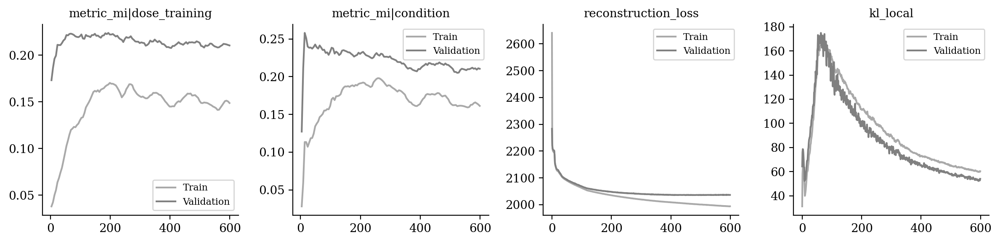

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|dose_training", "metric_mi|condition", "reconstruction_loss", "kl_local"],
    # metrics_name=["reconstruction_loss", "kl_local"],
)

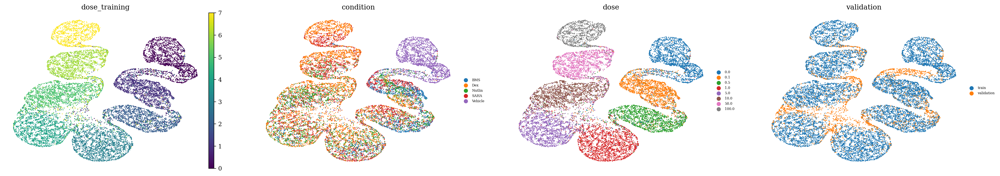

In [16]:
sublatent = DM.configurations.get_by_obs_key("dose_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent,
        color=["dose_training", "condition", "dose", "validation"],
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small",
    )

In [17]:
display(latent)
latent.write_h5ad(os.path.join(dataset_dir, f"tardis_cpa_sciplex_v2_encode_weight_scan_demo_run_dose.h5ad"))

AnnData object with n_obs × n_vars = 14811 × 8
    obs: 'sample', 'size_factor', 'n.umi', 'hash_umis', 'pval', 'qval', 'top_to_second_best_ratio', 'top_oligo', 'drug', 'dose', 'vehicle', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'product_dose', 'louvain', 'dose_val', 'cell_type', 'drug_dose_name', 'cov_drug_dose_name', 'condition', 'control', 'split', 'dose_training', '_scvi_batch', '_scvi_labels', 'validation'
    uns: 'neighbors', 'umap', 'condition_colors', 'dose_colors', 'validation_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

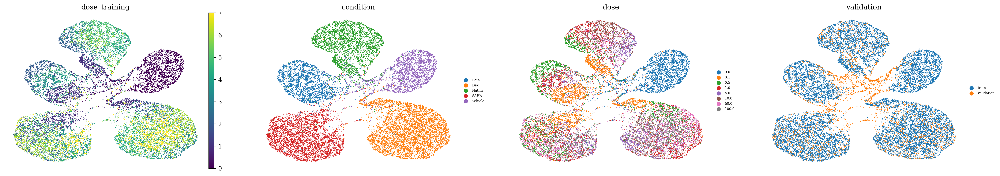

In [18]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent,
        color=["dose_training", "condition", "dose", "validation"],
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small",
    )

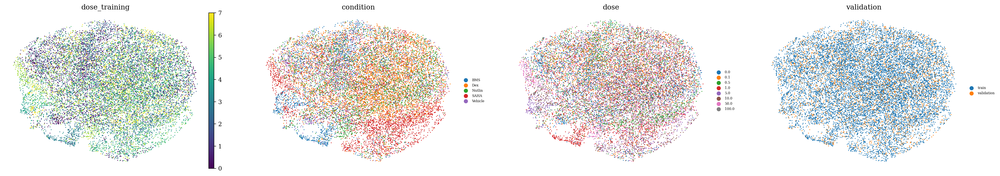

In [19]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent,
        color=["dose_training", "condition", "dose", "validation"],
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small",
    )

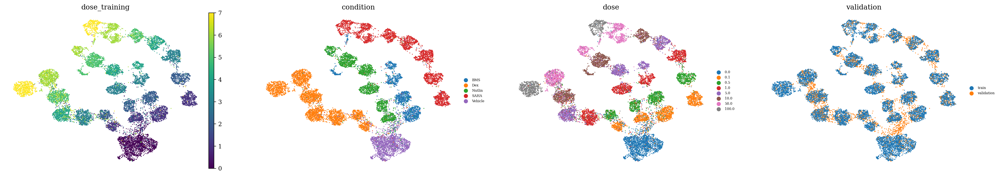

In [20]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent,
        color=["dose_training", "condition", "dose", "validation"],
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small",
    )

In [21]:
dm_indices = {
    "unreserved": DM.configurations.unreserved_latent_indices, 
    "condition": DM.configurations.get_by_obs_key("condition").reserved_latent_indices, 
    "dose_training": DM.configurations.get_by_obs_key("dose_training").reserved_latent_indices
}

pickle_indices_path = os.path.join(dataset_dir, f"tardis_cpa_sciplex_v2_encode_incremental_latent_indices.pkl")
with open(pickle_indices_path, "wb") as f:
    pickle.dump(dm_indices, f, protocol=pickle.HIGHEST_PROTOCOL)

# with open(pickle_indices_path, "rb") as f:
#     loaded_data = pickle.load(f)

# Resulting Latents

In [1]:
# for i, j in cb_latent.latents.items():
#     print(i)
#     # sublatent = DM.configurations.get_by_obs_key("dose_training").reserved_latent_indices
#     latent = ad.read_h5ad(j) #[:, sublatent]
#     latent.obs = adata.obs.copy()
    
#     sc.pp.neighbors(latent)
#     sc.tl.umap(latent)
    
#     with warnings.catch_warnings():
#         warnings.simplefilter("ignore")
#         sc.pl.umap(
#             latent,
#             color=["dose_training", "condition", "dose", "validation"],
#             ncols=4,
#             frameon=False,
#             legend_fontsize="xx-small",
#             title=[i, i, i, i]
#         )
#     print()